# Warehouse Optimization 
This is the environment code for the **Warehouse Problem statement** <br > 
It is a simplistic ***reinforcement learning*** environment where we are giving negative rewards to the robot based on where it gets the requested items from. Though, the rewards are set based on the get requests, we need to optimize the ***store()*** function, such that it stores the items in the racks leading to an optimized ***get()*** function. 

In [3]:
import random 
import numpy as np 

import collections
import sys 
import matplotlib.pyplot as plt 

Number of racks and items as defined for the initial problem statement

In [4]:
#nRacks = 12 
#nItems = 5 
'''
Making a global variable warehouse. 
It is a dictionary of the format: 
{ rack: (item, quantity) } 
'''
#warehouse = {a: (0,0) for a in range(1, nRacks+1)} 

'\nMaking a global variable warehouse. \nIt is a dictionary of the format: \n{ rack: (item, quantity) } \n'

**Store()** to store a given (item, quantity) in a rack. <br > 
**Dictionary ->  rack: (item id, item quantity)** <br >

In [5]:
def cyclic(rack): 
    if rack == 1: 
        return 12 
    else: 
        return rack-1 


#for i in range(1,13):
#    print cyclic(i) 


In [6]:
def warehousefull(warehouse): 
    #global warehouse 
    count = 0 
    for i in range(1,13): 
        if (warehouse[i] == (0,0)): break 
        else: count = count + 1 
    if (count == 12): return True
    else: return False 
#print warehousefull() 

In [7]:
def Store(rack, item, quantity): 
    if (rack not in warehouse): print "No rack {} in warehouse".format(rack) # No such rack exists  
    elif warehouse[rack] == (0,0): # Empty rack 
         warehouse[rack] = (item, quantity) 
         print "Stored item {} Successfully in an empty rack {} ".format(item, rack)
    elif (warehouse[rack][0] == item): # Rack already has some qauntity of that item 
        warehouse[rack] = (item, warehouse[rack][1]+quantity) 
        print "Updated Quantity of item {} in rack {} ".format(item, rack) 
    elif (warehousefull(warehouse) == True): print "Warehouse is Full!" 
    else: # Some other item is in that rack 
        print "Item {} has occupied the rack {}. Kindly store item {} somehere else. Thank you :)".format(warehouse[rack][0], rack, item) 
        print "cycle rack:", str(cyclic(rack))
        Store(cyclic(rack), item, quantity) 



Initialize the warehouse 


In [8]:
def initialise_warehouse(): 
    global nRacks, nItems, warehouse 
    nRacks = 12 
    nItems = 5 

    warehouse = {a: (0,0) for a in range(1, nRacks+1)} #re-initailizing to (0,0) for each rack 

    Store(1, 1, 10) 
    Store(2, 3, 10) 
    Store(5, 2, 10) 
    Store(11, 5, 10) 
    Store(8, 4, 10) 
#initialise_warehouse() 

Utility function to **print the Warehouse's State** <br > 

1->(0, 0)   4->(0, 0)	7->(0, 0)	10->(0, 0)	
2->(0, 0)	5->(0, 0)	8->(0, 0)   11->(0, 0)	
3->(0, 0)	6->(0, 0)	9->(0, 0)	12->(0, 0)	


In [9]:
def print_warehouse(): 
    print 
    for i in warehouse: 
        print str(i) + "->" + str(warehouse[i]) + "\t" 
        if i % 3 == 0: 
            print 
#print_warehouse() 

Rewards definition based on rack's location from the output (delivery) gate 

In [10]:
def rewards(rack): 
    if rack in range(1,4): return -400 
    elif rack in range(4,7): return -300 
    elif rack in range(7,10): return -200 
    elif rack in range(10,13): return -100 
    else: return 0 # Wrong rack 


**Get()** function to search for a requested item in the warehouse and get (deliver) it to the delivery gate and return a corresponding immediate reward for it. 

In [11]:
def Get(item, quantity): 
    rack = 0
    for i in warehouse: 
        if item in warehouse[i]: 
             rack = i # Rack number 

    #immediate reward 
    reward = -100



    if (rack == 0): print "Item {} not in warehouse".format(item) # No such rack exists  
    elif warehouse[rack] == (0,0): # Empty rack 
         print "Rack {} is an empty rack ".format(rack)
    elif (warehouse[rack][0] == item): # Rack already has some qauntity of that item 
        if (warehouse[rack][1] >= quantity): 
            warehouse[rack] = (item, warehouse[rack][1]-quantity) 
            #immediate reward 
            reward = rewards(rack)
            print "Delivery Successful" 
        else: 
            reward = rewards(rack) 
            warehouse[rack] = (0,0) 
            print "Quantity {} of item {} is unavailable currently. Delivered {} quantity as of now! ".format(quantity, item, warehouse[rack][1])
    else: # Some other item is in that rack 
        print "Item {} asked for is in rack {}. Kindly Get is from there. Thank you :)".format(item, rack) 

    return rack, reward 

    '''         
    done = False 
    info = 'info' 
    return [warehouse, reward, done, info] 
    ''' 

For testing the functions implemented till now :) 

In [12]:
def test(): 
    #testing Store() function 
    print "Testing Store() " 
    initialise_warehouse() 
    print_warehouse() 

    #further testing of Store() function 
    print "Further testing Store() " 
    Store(100, 4, 10) # No rack 100 
    Store(11,1,10) # Rack 11 already has item 5 
    print_warehouse() 

    # Testing of Get() function 
    print "Testing Get() " 
    print Get(5, 5) 
    print Get(4, 5) 
    print Get(2, 4) 

    print Get(11, 10) # No rack 100 
    print Get(1,100) # Rack 11 already has item 5 

    print_warehouse() 

#test() 

## Reinforcement Learning (RL) Strategies 

Running the ***RL script*** to accumulate the total rewards. <br > 
### Random Policy

In [13]:
initialise_warehouse() # just in case something has been modified (global variables) 
print_warehouse() 

Stored item 1 Successfully in an empty rack 1 
Stored item 3 Successfully in an empty rack 2 
Stored item 2 Successfully in an empty rack 5 
Stored item 5 Successfully in an empty rack 11 
Stored item 4 Successfully in an empty rack 8 

1->(1, 10)	
2->(3, 10)	
3->(0, 0)	

4->(0, 0)	
5->(2, 10)	
6->(0, 0)	

7->(0, 0)	
8->(4, 10)	
9->(0, 0)	

10->(0, 0)	
11->(5, 10)	
12->(0, 0)	



In [14]:
def random_strategy(): 
    rack = random.randint(1,12)  
    return rack 

In [15]:
def requests(): 
    requests = [] 
    for i in range(10000): 
        r = ""
        if (random.uniform(0,1) <= 0.3): r = r + "STORE " 
        else: r = r + "GET " 
        if random.uniform(0,1) < 0.25: 
            r = r + str(random.randint(1,4)) + " " + str(random.randint(1,1000)) 
        else: r = r + "5 " + str(random.randint(1,1000))
              #r = r + str(random.randint(4,5)) + " " + str(random.randint(1,1000)) 
        requests.append(r) 
    #print requests[:2] 
    







    '''requests = ["STORE 1 1000", "STORE 1 1000", "STORE 1 1000", "STORE 1 1000", 
               "STORE 1 1000", "STORE 1 1000", "STORE 1 1000", "STORE 1 1000", 
               "STORE 1 1000", "STORE 1 1000", "STORE 1 1000", "STORE 1 1000", 
               "STORE 1 1000", "STORE 1 1000", "STORE 1 1000", "STORE 1 1000", 
               "GET 1 1000", "GET 1 1000", "GET 1 1000", "GET 1 1000", "GET 1 1000", 
               "GET 1 1000", "GET 1 1000", "GET 1 1000", "GET 1 1000", "GET 1 1000", 
               "GET 1 1000", "GET 1 1000", "GET 1 1000", "GET 1 1000", "GET 1 1000", 
               "GET 1 1000", "GET 1 1000", "GET 1 1000", "GET 1 1000", "GET 1 1000", 
               "STORE 1 1000", "STORE 1 1000", "STORE 1 1000", "STORE 1 1000", 
               "STORE 1 1000", "STORE 1 1000", "STORE 1 1000", "STORE 1 1000"] ''' 

    '''requests = ["STORE 4 1000", "STORE 5 1000", 
                "STORE 1 10000", "STORE 2 1000", 
                "STORE 3 1000", "STORE 2 1000", 
                "STORE 1 1000", "GET 4 20", "GET 4 20", "GET 4 20", "GET 4 20", "GET 4 20", 
                "GET 3 20", "GET 2 20", 
                "GET 1 20", "GET 5 20", "GET 5 20", "GET 5 20", 
                "STORE 4 100", "STORE 2 100", 
                "STORE 1 100", "GET 1 100", "GET 1 100", 
               "GET 1 100", "GET 1 100", "GET 1 100", 
               "GET 1 100", "GET 1 100", "GET 1 100", 
               "GET 1 100", "GET 1 100", "GET 1 100", 
               "GET 1 100", "GET 1 100", "GET 1 100", "STORE 1 100", "STORE 2 100", 
               "STORE 3 100", "STORE 4 100", "STORE 5 100", ] ''' 
    return requests 
#requests()

In [16]:
def total_rewards(): 
    total_rewards = 0 
    requests_list = requests() 
    for req in requests_list: 
        r = req.split(' ') 
        reward = 0 
        if (r[0].strip() == "STORE"): 
            rack = random_strategy() #random racks allocated 
            #print rack 
            Store(rack, int(r[1]), int(r[2])) 
        else: #Get request 
            rack, reward = Get(int(r[1]), int(r[2])) 
            total_rewards = total_rewards + reward 
    #print_warehouse() 
    print "Total Rewards =", total_rewards 
    return total_rewards 

#total_rewards() 

In [17]:
def cum_rewards(): 
    cumulative_rewards = 0 
    reward_array = [] 
    for i in range(100): #number of episodes 
        total = total_rewards() 
        reward_array.append(total) 
        cumulative_rewards = cumulative_rewards + total 
        total = 0 
    print "Reward array =", reward_array 
    print "Cumulative Rewards =", cumulative_rewards 
    return cumulative_rewards 

print_warehouse() 
#c_rewards = cum_rewards() 


1->(1, 10)	
2->(3, 10)	
3->(0, 0)	

4->(0, 0)	
5->(2, 10)	
6->(0, 0)	

7->(0, 0)	
8->(4, 10)	
9->(0, 0)	

10->(0, 0)	
11->(5, 10)	
12->(0, 0)	



### Epsilon Greedy

In [18]:
def rankify(prob_dist): 
    seq = sorted(prob_dist) 
    ranks = [seq.index(v) for v in prob_dist] # highest probablity has highest rank 
    return ranks 
#rankify([1,2,3,4,5]) 
#rankify([0.25, 0.25, 0.25, 0.16666666666666666, 0.08333333333333333]) 
#rankify([0.7894736842105263, 0.05263157894736842, 0.05263157894736842, 0.05263157894736842, 0.05263157894736842])

In [19]:
def probability_distribution(get_item_array): 
    counter=collections.Counter(get_item_array) 
    prob_dist = [] 
    for i in range(1,6): 
        if (get_item_array != []): prob_dist.append(float(counter[i])/sum(counter.values())) 
    return prob_dist
#probability_distribution([])

In [20]:
def action(item_rank, ranks): 
    action = 0 
    if max(ranks) == 0: 
        action = 0 
    elif item_rank == max(ranks): 
        action = random.randint(10,12) 
    elif item_rank == (max(ranks) - 1): 
        action = random.randint(7,9) 
    elif item_rank == (max(ranks) - 2): 
        action = random.randint(4,6) 
    else: 
        action = random.randint(1,3) 
    
    return action 
#action(3, [0, 0, 0, 0, 0]) 

In [21]:
def total_rewards_egreedy(): 
    total_rewards = 0 
    requests_list = requests() 
    epsilon = 0.4 
    get_item_array = [] 
    for req in requests_list: 
        r = req.split(' ') 
        reward = 0 
        if (r[0].strip() == "STORE"): 
            if(random.uniform(0,1) < epsilon): 
                print "Hello random"
                rack = random_strategy() #random racks allocated 
                Store(rack, int(r[1]), int(r[2])) 
            else: 
                print "Hello strategy"
                prob_dist = probability_distribution(get_item_array) 
                if (prob_dist != []): 
                    print "Check = ", prob_dist 
                    ranks = rankify(prob_dist) 
                    item_rank = ranks[int(r[1])-1]
                    rack = action(item_rank, ranks) 
                    #print "ranks =", ranks
                    #print "rack = ", rack, 
                    Store(rack, int(r[1]), int(r[2])) 
                else: 
                    print "Hello random"
                    rack = random_strategy() #random racks allocated 
                    Store(rack, int(r[1]), int(r[2])) 
        else: 
            _, reward = Get(int(r[1]), int(r[2])) 
            get_item_array.append(int(r[1])) # make get_item_array 
            total_rewards = total_rewards + reward 
    #print_warehouse() 
    print "Total Rewards =", total_rewards 
    return total_rewards 

#total_rewards_egreedy() 

In [22]:
def cum_rewards_egreedy(): 
    cumulative_rewards = 0 
    reward_array = [] 
    for i in range(100): #number of episodes 
        total = total_rewards_egreedy() 
        reward_array.append(total) 
        cumulative_rewards = cumulative_rewards + total 
        print_warehouse() 
        total = 0 
    print "Reward array =", reward_array 
    print "Cumulative Rewards =", cumulative_rewards 
    return cumulative_rewards 

#c_rewards = cum_rewards_egreedy() 
print_warehouse() 


1->(1, 10)	
2->(3, 10)	
3->(0, 0)	

4->(0, 0)	
5->(2, 10)	
6->(0, 0)	

7->(0, 0)	
8->(4, 10)	
9->(0, 0)	

10->(0, 0)	
11->(5, 10)	
12->(0, 0)	



# Q Learning 

In [23]:
def print_matrix(matrix): 
    for i in matrix: 
        for k in range(12): 
            print str(i[k]) +"\t",
        print 


In [24]:
rows, columns = 5, 12 
R = [[rewards(x+1) for x in range(columns)] for y in range(rows)] 
print "R = " 
print_matrix(R) 
Q = [[0 for x in range(columns)] for y in range(rows)] 
print "Q= " 
print_matrix(Q) 

R = 
-400	-400	-400	-300	-300	-300	-200	-200	-200	-100	-100	-100	
-400	-400	-400	-300	-300	-300	-200	-200	-200	-100	-100	-100	
-400	-400	-400	-300	-300	-300	-200	-200	-200	-100	-100	-100	
-400	-400	-400	-300	-300	-300	-200	-200	-200	-100	-100	-100	
-400	-400	-400	-300	-300	-300	-200	-200	-200	-100	-100	-100	
Q= 
0	0	0	0	0	0	0	0	0	0	0	0	
0	0	0	0	0	0	0	0	0	0	0	0	
0	0	0	0	0	0	0	0	0	0	0	0	
0	0	0	0	0	0	0	0	0	0	0	0	
0	0	0	0	0	0	0	0	0	0	0	0	


In [25]:
def rem(arr, action): 
    arr[action] = - sys.maxint 
    return arr 
rem([1,2,3],2)

[1, 2, -9223372036854775807]

In [26]:
def update_Q(state, action): 
    global Q 
    gamma = 1.0 #0.8 
    Q[state][action] = R[state][action] + round(gamma * max(rem(Q[state],action)),2)  
#update_Q(0,1)
print_matrix(Q)

0	0	0	0	0	0	0	0	0	0	0	0	
0	0	0	0	0	0	0	0	0	0	0	0	
0	0	0	0	0	0	0	0	0	0	0	0	
0	0	0	0	0	0	0	0	0	0	0	0	
0	0	0	0	0	0	0	0	0	0	0	0	


In [27]:
def egreedy(state): 
    global Q 
    epsilon = 0.6 
    if (random.uniform(0,1) < epsilon): 
        
        print "random"
        action = random_strategy() 
    else: 
        print "Q"
        action = Q[state].index(max(Q[state])) + 1 
    
    return action 
egreedy(2)

random


9

In [29]:
def plot(array): 
    plt.plot(array) 
#plot([1,2,3,4])

GET 5 710
Quantity 710 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 2 664
random
rack 1
Item 1 has occupied the rack 1. Kindly store item 2 somehere else. Thank you :)
cycle rack: 12
Stored item 2 Successfully in an empty rack 12 
GET 5 228
Item 5 not in warehouse
STORE 5 396
random
rack 9
Stored item 5 Successfully in an empty rack 9 
GET 2 3
Delivery Successful
GET 5 999
Quantity 999 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 728
Item 5 not in warehouse
GET 5 9
Item 5 not in warehouse
GET 5 448
Item 5 not in warehouse
STORE 5 167
random
rack 12
Item 2 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Stored item 5 Successfully in an empty rack 11 
STORE 5 275
random
rack 5
Item 2 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Stored item 5 Successfully in an empty rack 4 
GET 3 570
Quantity 570 of item 3 is unavailable currently. Delivered 0 qua

Item 5 not in warehouse
GET 5 178
Item 5 not in warehouse
STORE 1 883
random
rack 1
Item 2 has occupied the rack 1. Kindly store item 1 somehere else. Thank you :)
cycle rack: 12
Item 3 has occupied the rack 12. Kindly store item 1 somehere else. Thank you :)
cycle rack: 11
Stored item 1 Successfully in an empty rack 11 
STORE 5 419
Q
rack 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 3 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 3 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
GET 1 50
Delivery Successful
STORE 5 961
random
rack 4
Item 2 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :

Item 5 not in warehouse
GET 5 807
Item 5 not in warehouse
GET 5 102
Item 5 not in warehouse
GET 5 295
Item 5 not in warehouse
GET 2 5
Item 2 not in warehouse
GET 5 930
Item 5 not in warehouse
GET 5 691
Item 5 not in warehouse
STORE 4 755
random
rack 12
Stored item 4 Successfully in an empty rack 12 
GET 5 372
Item 5 not in warehouse
STORE 5 212
random
rack 2
Stored item 5 Successfully in an empty rack 2 
GET 5 556
Quantity 556 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 213
Item 5 not in warehouse
STORE 5 34
random
rack 8
Stored item 5 Successfully in an empty rack 8 
STORE 5 471
random
rack 8
Updated Quantity of item 5 in rack 8 
GET 5 659
Quantity 659 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 108
Item 5 not in warehouse
STORE 5 517
random
rack 4
Stored item 5 Successfully in an empty rack 4 
GET 5 377
Delivery Successful
STORE 5 107
random
rack 7
Stored item 5 Successfully in an empty rack 7 
GET 5 811
Quantity 811 of it

GET 5 246
Delivery Successful
GET 5 54
Delivery Successful
GET 5 374
Quantity 374 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 543
random
rack 2
Updated Quantity of item 5 in rack 2 
GET 5 313
Delivery Successful
GET 5 763
Delivery Successful
STORE 5 428
random
rack 1
Stored item 5 Successfully in an empty rack 1 
GET 5 645
Quantity 645 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 235
Item 3 not in warehouse
GET 5 39
Delivery Successful
GET 5 987
Quantity 987 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 737
Item 5 not in warehouse
GET 1 685
Item 1 not in warehouse
STORE 5 397
random
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 5 89
Delivery Successful
GET 5 624
Quantity 624 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 923
Item 1 not in warehouse
GET 5 495
Item 5 not in warehouse
GET 5 220
Item 5 not in warehouse
STORE 5 409
random
rack 5
Stored item 5

Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 967
Quantity 967 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 74
Delivery Successful
STORE 5 159
Q
rack 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in rack 1 
GET 5 917
Quantity 917 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 24
Item 5 not in warehouse
GET 5 523
Item 5 not in warehouse
GET 3 474
Quantity 474 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 486
Item 5 not in warehouse
STORE 5 557
Q
rack 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 887
Quantity 887 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 748
Item 5 not in warehouse
GET 5 102
It

Delivery Successful
GET 1 538
Item 1 not in warehouse
STORE 1 703
Q
rack 1
Item 3 has occupied the rack 1. Kindly store item 1 somehere else. Thank you :)
cycle rack: 12
Item 3 has occupied the rack 12. Kindly store item 1 somehere else. Thank you :)
cycle rack: 11
Item 4 has occupied the rack 11. Kindly store item 1 somehere else. Thank you :)
cycle rack: 10
Item 5 has occupied the rack 10. Kindly store item 1 somehere else. Thank you :)
cycle rack: 9
Item 5 has occupied the rack 9. Kindly store item 1 somehere else. Thank you :)
cycle rack: 8
Stored item 1 Successfully in an empty rack 8 
GET 5 722
Quantity 722 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 659
Delivery Successful
GET 1 947
Quantity 947 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 904
Quantity 904 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 639
Item 1 not in warehouse
GET 5 799
Quantity 799 of item 5 is unavailable currently. Del

rack 4
Item 2 has occupied the rack 4. Kindly store item 3 somehere else. Thank you :)
cycle rack: 3
Stored item 3 Successfully in an empty rack 3 
GET 3 102
Delivery Successful
GET 5 467
Quantity 467 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 772
Item 5 not in warehouse
GET 5 976
Item 5 not in warehouse
GET 5 624
Item 5 not in warehouse
GET 5 17
Item 5 not in warehouse
GET 5 895
Item 5 not in warehouse
GET 5 61
Item 5 not in warehouse
STORE 5 854
random
rack 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
STORE 5 898
Q
rack 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 3 549
Quantity 549 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 213
Delivery Successful
STORE 5 740
random
rack 6
Stored item 5 Successfully in an empty rack 6 


cycle rack: 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Updated Quantity of item 5 in rack 11 
GET 3 97
Item 3 not in warehouse
STORE 5 322
random
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 5 489
Delivery Successful
GET 3 489
Item 3 not in warehouse
STORE 3 999
random
rack 11
Item 5 has occupied the rack 11. Kindly store item 3 somehere else. Thank you :)
cycle rack: 10
Stored item 3 Successfully in an empty rack 10 
GET 5 338
Quantity 338 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 43
Delivery Successful
GET 5 988
Quantity 988 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 3 731
Q
rack 4
Stored item 3 Successfully in an empty rack 4 
GET 5 516
Item 5 not in warehouse
GET 2 742
Delivery Successful
STORE 5 896
random
rack 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 1 has occupied the rack 3. Kindly store

Stored item 1 Successfully in an empty rack 9 
GET 5 769
Quantity 769 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 342
Delivery Successful
STORE 5 580
random
rack 10
Updated Quantity of item 5 in rack 10 
GET 5 444
Delivery Successful
GET 5 949
Quantity 949 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 397
Item 4 not in warehouse
STORE 5 304
random
rack 9
Item 1 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
GET 5 954
Quantity 954 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 943
Quantity 943 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 479
random
rack 9
Item 1 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
GET 5 242
Delivery Successful
STORE 5 196
Q
rack 1
Item 1 has occupied the rack 1. Kindly s

GET 5 957
Quantity 957 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 718
Quantity 718 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 321
Delivery Successful
GET 5 946
Quantity 946 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 257
Quantity 257 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 2 116
random
rack 2
Stored item 2 Successfully in an empty rack 2 
GET 5 378
Delivery Successful
STORE 5 242
Q
rack 7
Item 1 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Successfully in an empty rack 6 
STORE 4 6
Q
rack 12
Stored item 4 Successfully in an empty rack 12 
GET 2 683
Delivery Successful
STORE 2 834
Q
rack 11
Item 1 has occupied the rack 11. Kindly store item 2 somehere else. Thank you :)
cycle rack: 10
Updated Quantity of item 2 in rack 10 
STORE 5 254
random
rack 4
Item 3 has occupied the rack 4. Kindly store item 5 some

rack 12
Item 3 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Stored item 5 Successfully in an empty rack 10 
GET 5 804
Quantity 804 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 794
Delivery Successful
GET 5 456
Delivery Successful
STORE 5 119
Q
rack 4
Item 2 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in rack 1 
STORE 1 681
Q
rack 10
Stored item 1 Successfully in an empty rack 10 
GET 5 205
Delivery Successful
GET 5 283
Delivery Successful
GET 5 426
Delivery Successful
GET 4 143
Delivery Successful
GET 3 5
Delivery Successful
GET 5 999
Quantity 999 of item 5 is unava

cycle rack: 8
Updated Quantity of item 5 in rack 8 
STORE 1 80
random
rack 5
Item 2 has occupied the rack 5. Kindly store item 1 somehere else. Thank you :)
cycle rack: 4
Item 2 has occupied the rack 4. Kindly store item 1 somehere else. Thank you :)
cycle rack: 3
Updated Quantity of item 1 in rack 3 
STORE 5 665
Q
rack 9
Item 3 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Updated Quantity of item 5 in rack 8 
GET 5 491
Delivery Successful
GET 4 210
Item 4 not in warehouse
STORE 5 811
random
rack 6
Item 3 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Item 2 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 2 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 1 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :

random
rack 4
Item 5 has occupied the rack 4. Kindly store item 4 somehere else. Thank you :)
cycle rack: 3
Stored item 4 Successfully in an empty rack 3 
STORE 5 630
Q
rack 12
Stored item 5 Successfully in an empty rack 12 
GET 5 713
Quantity 713 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 322
Quantity 322 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 467
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 5 72
Delivery Successful
STORE 5 891
Q
rack 5
Stored item 5 Successfully in an empty rack 5 
GET 5 635
Quantity 635 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 943
Quantity 943 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 2 612
Q
rack 3
Item 4 has occupied the rack 3. Kindly store item 2 somehere else. Thank you :)
cycle rack: 2
Stored item 2 Successfully in an empty rack 2 
STORE 3 876
Q
rack 10
Updated Quantity of item 3 in rack 10 
GET 5 163
De

Quantity 687 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 336
random
rack 4
Item 1 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Stored item 5 Successfully in an empty rack 3 
GET 5 926
Quantity 926 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 467
Q
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 5 846
Quantity 846 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 714
Q
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 5 334
Delivery Successful
GET 5 765
Quantity 765 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 597
random
rack 3
Stored item 5 Successfully in an empty rack 3 
GET 5 360
Delivery Successful
GET 5 678
Quantity 678 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 253
Delivery Successful
GET 5 108
Item 5 not in warehouse
GET 5 634
Item 5 not in warehouse
STORE 3 437


rack 3
Stored item 5 Successfully in an empty rack 3 
GET 5 20
Delivery Successful
GET 5 817
Quantity 817 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 530
Q
rack 10
Updated Quantity of item 5 in rack 10 
GET 5 580
Delivery Successful
STORE 1 459
random
rack 3
Item 5 has occupied the rack 3. Kindly store item 1 somehere else. Thank you :)
cycle rack: 2
Updated Quantity of item 1 in rack 2 
STORE 5 667
Q
rack 11
Item 2 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Updated Quantity of item 5 in rack 10 
GET 5 698
Delivery Successful
GET 5 277
Delivery Successful
GET 2 775
Quantity 775 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 300
Quantity 300 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 394
Delivery Successful
GET 5 4
Delivery Successful
STORE 5 602
Q
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 5 593
Delivery Successful
GET 5 732
Quantit

Stored item 4 Successfully in an empty rack 3 
GET 5 557
Item 5 not in warehouse
STORE 5 692
random
rack 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 4 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 3 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Stored item 5 Successfully in an empty rack 10 
STORE 5 176
random
rack 12
Item 4 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 3 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Updated Quantity of item 5 in rack 10 
GET 5 475
Delivery Successful
GET 1 746
Quantity 746 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 993
Quantity 993 of item 5 is unavailable currently. Delivered 0 quantity as o

rack 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Updated Quantity of item 5 in rack 9 
GET 5 259
Delivery Successful
STORE 5 12
random
rack 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Updated Quantity of item 5 in rack 9 
STORE 5 909
random
rack 3
Updated Quantity of item 5 in rack 3 
GET 2 844
Quantity 844 of item 2 i

cycle rack: 9
Item 1 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
GET 5 950
Quantity 950 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 177
random
rack 5
Item 3 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 1 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 3 441
Delivery Successful
STORE 5 464
Q
rack 10
Item 1 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 1 has occupied the rack 9. Kindly store item 5 somehere 

rack 4
Stored item 3 Successfully in an empty rack 4 
GET 5 719
Item 5 not in warehouse
GET 5 418
Item 5 not in warehouse
GET 2 534
Item 2 not in warehouse
GET 5 822
Item 5 not in warehouse
STORE 5 655
random
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 4 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 4 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 3 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
GET 5 333
Delivery Successful
GET 5 404
Quantity 404 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 723
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 4 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 4 has occupied t

rack 2
Item 4 has occupied the rack 2. Kindly store item 2 somehere else. Thank you :)
cycle rack: 1
Item 4 has occupied the rack 1. Kindly store item 2 somehere else. Thank you :)
cycle rack: 12
Item 5 has occupied the rack 12. Kindly store item 2 somehere else. Thank you :)
cycle rack: 11
Stored item 2 Successfully in an empty rack 11 
STORE 5 653
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
STORE 5 912
random
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
GET 5 32
Delivery Successful
GET 5 92
Delivery Successful
GET 5 203
Delivery Successful
GET 4 288
Delivery Successful
GET 5 367
Delivery Successful
STORE 2 685
random
rack 10
Stored item 2 Successfully in an empty rack 10 
GET 3 654
Item 3 not in warehouse
GET 5 973
Delivery Successful
STORE 4 661
Q
rack 8
Stored item 4 Successfully in an empt

Item 1 not in warehouse
STORE 1 762
Q
rack 1
Stored item 1 Successfully in an empty rack 1 
STORE 5 506
Q
rack 6
Updated Quantity of item 5 in rack 6 
GET 5 200
Item 5 asked for is in rack 10. Kindly Get is from there. Thank you :)
GET 5 336
Item 5 asked for is in rack 10. Kindly Get is from there. Thank you :)
GET 5 52
Item 5 asked for is in rack 10. Kindly Get is from there. Thank you :)
GET 5 66
Item 5 asked for is in rack 10. Kindly Get is from there. Thank you :)
STORE 4 673
Q
rack 7
Stored item 4 Successfully in an empty rack 7 
STORE 4 580
Q
rack 7
Updated Quantity of item 4 in rack 7 
GET 5 253
Item 5 asked for is in rack 10. Kindly Get is from there. Thank you :)
GET 5 256
Item 5 asked for is in rack 10. Kindly Get is from there. Thank you :)
GET 5 331
Item 5 asked for is in rack 10. Kindly Get is from there. Thank you :)
GET 4 294
Delivery Successful
GET 5 461
Item 5 asked for is in rack 10. Kindly Get is from there. Thank you :)
GET 5 538
Item 5 asked for is in rack 10. Kind

random
rack 4
Item 5 has occupied the rack 4. Kindly store item 2 somehere else. Thank you :)
cycle rack: 3
Item 1 has occupied the rack 3. Kindly store item 2 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 2 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 2 somehere else. Thank you :)
cycle rack: 12
Item 3 has occupied the rack 12. Kindly store item 2 somehere else. Thank you :)
cycle rack: 11
Item 1 has occupied the rack 11. Kindly store item 2 somehere else. Thank you :)
cycle rack: 10
Updated Quantity of item 2 in rack 10 
GET 1 880
Quantity 880 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 401
Delivery Successful
GET 5 32
Delivery Successful
STORE 5 516
random
rack 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 4 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Stored item 5

GET 5 596
Item 5 not in warehouse
GET 5 126
Item 5 not in warehouse
STORE 4 985
random
rack 5
Updated Quantity of item 4 in rack 5 
GET 5 168
Item 5 not in warehouse
GET 5 893
Item 5 not in warehouse
STORE 5 442
Q
rack 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 46
Delivery Successful
GET 5 782
Quantity 782 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 531
Q
rack 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 2
Delivery Successful
GET 5 939
Quantity 939 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 964
Item 5 not in warehouse
GET 5 587

cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
GET 5 419
Delivery Successful
STORE 5 474
Q
rack 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Updated Quantity of item 5 in rack 8 
GET 5 91
Delivery Successful
STORE 5 8
random
rack 6
Updated Quantity of item 5 in rack 6 
GET 5 135
Delivery Successful
GET 4 141
Delivery Successful
GET 3 835
Item 3 not in warehouse
GET 5 913
Quantity 913 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 324
Quantity 324 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 608
random
rack 6
Stored item 5 Successfully in an empty rack 6 
STORE 5 789
Q
rack 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored 

GET 4 159
Delivery Successful
STORE 5 16
random
rack 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Updated Quantity of item 5 in rack 2 
STORE 5 211
random
rack 5
Item 2 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Updated Quantity of item 5 in rack 2 
GET 5 168
Delivery Successful
GET 5 175
Delivery Successful
GET 5 634
Quantity 634 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 385
Item 5 not in warehouse
STORE 5 23
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 5 714
Quantity 714 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 2
random
rack

GET 5 29
Delivery Successful
GET 5 9
Delivery Successful
STORE 5 682
random
rack 7
Updated Quantity of item 5 in rack 7 
GET 5 727
Delivery Successful
GET 5 825
Quantity 825 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 66
Q
rack 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 1 473
Item 1 not in warehouse
GET 3 167
Delivery Successful
GET 5 78
Quantity 78 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 204
Delivery Successful
GET 5 961
Delivery Successful
GET 5 109
Delivery Successful
STORE 5 588
Q
rack 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 946
Quantity 946 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 737
Item 1 not in warehouse
GET 5 350
Quantity 350 of item 5 is unavailable currently. D

Item 5 not in warehouse
GET 5 42
Item 5 not in warehouse
GET 5 649
Item 5 not in warehouse
GET 5 442
Item 5 not in warehouse
GET 5 370
Item 5 not in warehouse
STORE 5 630
Q
rack 8
Item 3 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 2 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Stored item 5 Successfully in an empty rack 5 
GET 5 138
Delivery Successful
STORE 1 651
random
rack 7
Item 3 has occupied the rack 7. Kindly store item 1 somehere else. Thank you :)
cycle rack: 6
Item 2 has occupied the rack 6. Kindly store item 1 somehere else. Thank you :)
cycle rack: 5
Item 5 has occupied the rack 5. Kindly store item 1 somehere else. Thank you :)
cycle rack: 4
Item 3 has occupied the rack 4. Kindly store item 1 somehere else. Thank you :)
cycle rack: 3
Stored item 1 Successfully in an empty rack 3 
GET 5 895
Qu

Stored item 5 Successfully in an empty rack 1 
STORE 5 738
random
rack 8
Stored item 5 Successfully in an empty rack 8 
GET 5 783
Quantity 783 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 932
Quantity 932 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 406
Delivery Successful
GET 5 581
Item 5 not in warehouse
GET 5 63
Item 5 not in warehouse
STORE 5 678
random
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 5 532
Delivery Successful
GET 1 266
Item 1 not in warehouse
GET 1 599
Item 1 not in warehouse
STORE 5 779
Q
rack 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Stored item 5 Successfully in an empty rack 2 
GET 5 28
Delivery Successful
GET 5 223
Quantity 223 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 945
Quantity 945 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 396
Item 5 not in warehouse
GET 5 701
Item 5 

cycle rack: 3
Item 3 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Stored item 5 Successfully in an empty rack 2 
GET 5 903
Quantity 903 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 232
Delivery Successful
STORE 5 342
random
rack 12
Stored item 5 Successfully in an empty rack 12 
GET 5 576
Quantity 576 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 598
Delivery Successful
STORE 5 434
Q
rack 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
STORE 5 942
Q
rack 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
GET 5 610
Delivery Successful
GET 4 715
Delivery Successful
GET 5 102
Delivery Successful
GET 5 325
Delivery Successful
GET 5 854
Quantity 854 of item 5 is unavailable currently. Delivered 0 quantity as of n

GET 5 696
Delivery Successful
GET 5 997
Quantity 997 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 802
Item 5 not in warehouse
STORE 1 642
random
rack 4
Stored item 1 Successfully in an empty rack 4 
GET 5 524
Item 5 not in warehouse
GET 5 306
Item 5 not in warehouse
STORE 5 16
random
rack 5
Stored item 5 Successfully in an empty rack 5 
STORE 4 237
Q
rack 1
Item 2 has occupied the rack 1. Kindly store item 4 somehere else. Thank you :)
cycle rack: 12
Stored item 4 Successfully in an empty rack 12 
GET 5 410
Quantity 410 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 672
Item 5 not in warehouse
GET 5 709
Item 5 not in warehouse
STORE 5 707
random
rack 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 4 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Stored item 5 Successfully in an empty rack 11 
GET 2 872
Quantity 872 of item 2 is unavai

Quantity 581 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 860
Item 5 not in warehouse
GET 5 94
Item 5 not in warehouse
GET 1 64
Delivery Successful
GET 5 959
Item 5 not in warehouse
STORE 2 93
random
rack 5
Updated Quantity of item 2 in rack 5 
STORE 5 283
random
rack 6
Item 1 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Item 2 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Stored item 5 Successfully in an empty rack 4 
GET 5 387
Quantity 387 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 801
Item 5 not in warehouse
STORE 4 907
random
rack 7
Stored item 4 Successfully in an empty rack 7 
STORE 1 187
random
rack 9
Stored item 1 Successfully in an empty rack 9 
GET 5 725
Item 5 not in warehouse
GET 5 128
Item 5 not in warehouse
GET 5 133
Item 5 not in warehouse
STORE 5 216
random
rack 9
Item 1 has occupied the rack 9. Kindly store item 5 somehere els

Item 3 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 2 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 4 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Stored item 5 Successfully in an empty rack 7 
GET 4 6
Delivery Successful
GET 5 966
Quantity 966 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 47
Delivery Successful
GET 5 246
Delivery Successful
GET 5 118
Delivery Successful
STORE 5 47
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 3 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 2 has occupied the rack 9. Kindly store item 5 someher

cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
GET 5 931
Quantity 931 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 189
random
rack 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 2 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 4 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
STORE 1 75
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 1 somehere else. Thank you :)
cycle rack

Delivery Successful
STORE 5 977
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 2 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Updated Quantity of item 5 in rack 11 
GET 5 253
Delivery Successful
GET 5 637
Delivery Successful
GET 5 599
Delivery Successful
STORE 1 45
random
rack 7
Item 3 has occupied the rack 7. Kindly store item 1 somehere else. Thank you :)
cycle rack: 6
Item 3 has occupied the rack 6. Kindly store item 1 somehere else. Thank you :)
cycle rack: 5
Item 2 has occupied the rack 5. Kindly store item 1 somehere else. Thank you :)
cycle rack: 4
Updated Quantity of item 1 in rack 4 
GET 5 85
Delivery Successful
GET 5 979
Delivery Successful
GET 5 557
Delivery Successful
GET 5 758
Quantity 758 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 946
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 

rack 6
Stored item 5 Successfully in an empty rack 6 
STORE 5 236
Q
rack 6
Updated Quantity of item 5 in rack 6 
GET 5 877
Quantity 877 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 854
Q
rack 7
Stored item 5 Successfully in an empty rack 7 
GET 5 344
Delivery Successful
GET 2 839
Item 2 not in warehouse
GET 5 990
Quantity 990 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 586
Item 5 not in warehouse
GET 5 421
Item 5 not in warehouse
GET 5 255
Item 5 not in warehouse
STORE 5 622
random
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 5 129
Delivery Successful
GET 5 162
Delivery Successful
STORE 5 515
Q
rack 9
Stored item 5 Successfully in an empty rack 9 
GET 4 523
Item 4 not in warehouse
GET 5 791
Quantity 791 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 703
random
rack 2
Stored item 5 Successfully in an empty rack 2 
GET 1 102
Item 1 not in warehouse
STORE 5 945
Q
rack 10
Stored item 5

Delivery Successful
GET 5 658
Quantity 658 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 901
Quantity 901 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 330
Delivery Successful
GET 5 377
Quantity 377 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 778
random
rack 1
Stored item 5 Successfully in an empty rack 1 
STORE 5 4
Q
rack 5
Item 1 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Stored item 5 Successfully in an empty rack 4 
GET 1 597
Delivery Successful
STORE 2 827
Q
rack 11
Stored item 2 Successfully in an empty rack 11 
GET 5 727
Quantity 727 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 741
Item 4 not in warehouse
GET 5 473
Delivery Successful
GET 4 831
Item 4 not in warehouse
STORE 5 294
random
rack 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in r

Item 5 not in warehouse
GET 5 630
Item 5 not in warehouse
GET 5 814
Item 5 not in warehouse
GET 5 424
Item 5 not in warehouse
GET 5 584
Item 5 not in warehouse
GET 5 612
Item 5 not in warehouse
GET 3 409
Item 3 not in warehouse
GET 5 854
Item 5 not in warehouse
GET 1 405
Delivery Successful
GET 5 850
Item 5 not in warehouse
GET 5 933
Item 5 not in warehouse
GET 5 119
Item 5 not in warehouse
STORE 5 560
random
rack 4
Item 1 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 333
Delivery Successful
STORE 5 941
random
rack 8
Item 2 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 2 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 2 

Item 3 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Updated Quantity of item 5 in rack 7 
GET 4 442
Item 4 not in warehouse
GET 5 550
Delivery Successful
GET 5 428
Quantity 428 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 171
Item 5 not in warehouse
STORE 5 922
Q
rack 8
Item 3 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Stored item 5 Successfully in an empty rack 7 
GET 5 274
Delivery Successful
GET 5 368
Delivery Successful
STORE 5 718
Q
rack 8
Item 3 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Updated Quantity of item 5 in rack 7 
GET 2 331
Item 2 not in warehouse
GET 5 354
Delivery Successful
GET 5 100
Delivery Successful
GET 5 897
Quantity 897 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 471
Quantity 471 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 764
Item 2 not in w

Delivery Successful
GET 5 986
Quantity 986 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 750
Item 2 not in warehouse
GET 5 125
Item 5 not in warehouse
GET 3 616
Quantity 616 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 134
Q
rack 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Successfully in an empty rack 6 
STORE 5 374
Q
rack 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Updated Quantity of item 5 in rack 6 
STORE 5 325
random
rack 12
Stored item 5 Successfully in an empty rack 12 
GET 5 604
Quantity 604 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 354
Q
rack 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Updated Quantity of item 5 in rack 6 
GET 5 801
Delivery Successful
STORE 2 422
random
rack 9
Stored item 2 Successfully in an empt

rack 12
Stored item 5 Successfully in an empty rack 12 
GET 5 568
Quantity 568 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 2 182
random
rack 1
Item 1 has occupied the rack 1. Kindly store item 2 somehere else. Thank you :)
cycle rack: 12
Stored item 2 Successfully in an empty rack 12 
STORE 5 826
Q
rack 4
Item 4 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 3 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Updated Quantity of item 5 in rack 2 
STORE 5 703
random
rack 12
Item 2 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Stored item 5 Successfully in an empty rack 10 
STORE 5 475
Q
rack 4
Item 4 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 3 has occupied the rack 3. Kindly store item 5 so

GET 5 688
Quantity 688 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 386
Item 5 not in warehouse
GET 1 878
Item 1 not in warehouse
GET 5 848
Item 5 not in warehouse
GET 2 199
Item 2 not in warehouse
GET 3 460
Quantity 460 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 580
Item 1 not in warehouse
GET 1 173
Item 1 not in warehouse
GET 5 883
Item 5 not in warehouse
GET 5 525
Item 5 not in warehouse
GET 5 860
Item 5 not in warehouse
GET 5 181
Item 5 not in warehouse
STORE 4 1
random
rack 9
Stored item 4 Successfully in an empty rack 9 
STORE 5 395
random
rack 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 4 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Stored item 5 Successfully in an empty rack 7 
STORE 5 690
random
rack 11
Stored item 5 Success

rack 12
Stored item 5 Successfully in an empty rack 12 
STORE 5 390
random
rack 4
Stored item 5 Successfully in an empty rack 4 
STORE 5 528
random
rack 6
Updated Quantity of item 5 in rack 6 
STORE 5 699
Q
rack 5
Item 4 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Updated Quantity of item 5 in rack 4 
GET 5 80
Delivery Successful
GET 5 995
Quantity 995 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 326
Delivery Successful
STORE 5 771
random
rack 4
Updated Quantity of item 5 in rack 4 
GET 5 657
Quantity 657 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 993
Item 2 not in warehouse
GET 5 950
Delivery Successful
STORE 5 228
random
rack 1
Stored item 5 Successfully in an empty rack 1 
GET 5 685
Delivery Successful
GET 5 178
Delivery Successful
GET 5 530
Quantity 530 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 740
Quantity 740 of item 5 is unavailable currently.

Quantity 171 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 654
Quantity 654 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 238
Item 5 not in warehouse
GET 3 110
Item 3 not in warehouse
GET 3 157
Item 3 not in warehouse
GET 5 629
Item 5 not in warehouse
STORE 5 138
random
rack 9
Stored item 5 Successfully in an empty rack 9 
GET 5 934
Quantity 934 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 439
Item 5 not in warehouse
GET 5 777
Item 5 not in warehouse
STORE 5 914
random
rack 4
Stored item 5 Successfully in an empty rack 4 
GET 5 229
Delivery Successful
STORE 3 67
Q
rack 2
Stored item 3 Successfully in an empty rack 2 
GET 5 164
Delivery Successful
STORE 5 528
random
rack 7
Item 4 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Successfully in an empty rack 6 
GET 5 210
Delivery Successful
GET 5 737
Quantity 737 of item 5 is unavailable currently. D

STORE 5 173
Q
rack 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Updated Quantity of item 5 in rack 9 
GET 5 587
Delivery Successful
GET 5 339
Delivery Successful
GET 5 445
Quantity 445 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 615
Item 5 not in warehouse
GET 5 528
Item 5 not in warehouse
STORE 4 937
random
rack 10
Updated Quantity of item 4 in rack 10 
GET 4 965
Quantity 965 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 689
random
rack 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 3 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Stored item 5 Successfully in an empty rack 2 
STORE 4 293
Q
rack 10
Updated Quantity of item 4 in rack 10 
STORE 5 628
random
rack 2
Updated Quantity of item 5 in rack 2 
GET 5 105
Delivery Successful
GET 5 625
Delivery Successful
STORE 5 158
random
ra

STORE 5 844
random
rack 10
Stored item 5 Successfully in an empty rack 10 
STORE 5 879
random
rack 5
Item 3 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 1 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Updated Quantity of item 5 in rack 2 
GET 5 244
Delivery Successful
GET 5 902
Quantity 902 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 1 354
Q
rack 7
Item 3 has occupied the rack 7. Kindly store item 1 somehere else. Thank you :)
cycle rack: 6
Item 3 has occupied the rack 6. Kindly store item 1 somehere else. Thank you :)
cycle rack: 5
Item 3 has occupied the rack 5. Kindly store item 1 somehere else. Thank you :)
cycle rack: 4
Updated Quantity of item 1 in rack 4 
GET 5 991
Quantity 991 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 200
Q
rack 1
Ite

Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
GET 5 266
Delivery Successful
GET 5 37
Delivery Successful
GET 5 636
Delivery Successful
GET 5 645
Delivery Successful
GET 1 484
Quantity 484 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 105
Delivery Successful
GET 4 862
Quantity 862 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 767
Quantity 767 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 974
Quantity 974 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 4 430
Q
rack 5
Updated Quantity of item 4 in rack 5 
GET 1 898
Quantity 898 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 918
Item 5 not in warehouse
GET 5 674
Item 5 not in warehouse
STORE 5 660
random
rack 12
Stored item 5 Successfully in an empty rack 12 
GET 3 313
Delivery Successful
GET 5 734
Quantity 734 of

cycle rack: 5
Updated Quantity of item 5 in rack 5 
STORE 5 288
random
rack 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 1 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 1 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 4 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 2 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Updated Quantity of item 5 in rack 5 
GET 5 578
Delivery Successful
GET 5 762
Quantity 762 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 987
Item 5 not in warehouse
GET 5 75
Item 5 not in warehouse
GET 5 30
Item 5 not in warehouse
STORE 5 889
Q
rack 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank 

Q
rack 7
Item 4 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Updated Quantity of item 5 in rack 6 
GET 5 183
Delivery Successful
GET 5 701
Delivery Successful
GET 5 937
Quantity 937 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 550
Delivery Successful
GET 3 751
Delivery Successful
STORE 5 391
random
rack 3
Item 1 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 114
Delivery Successful
GET 5 441
Quantity 441 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 896
Q
rack 7
Item 4 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Updated Quantity of item 5 in rack 6 
GET 2 586
Quant

Quantity 637 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 168
Item 5 not in warehouse
STORE 5 706
random
rack 6
Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Stored item 5 Successfully in an empty rack 5 
GET 5 457
Delivery Successful
GET 2 266
Item 2 not in warehouse
GET 5 987
Quantity 987 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 768
Delivery Successful
GET 1 221
Quantity 221 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 562
Quantity 562 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 190
Item 5 not in warehouse
GET 1 163
Item 1 not in warehouse
GET 4 286
Delivery Successful
GET 1 582
Item 1 not in warehouse
GET 5 222
Item 5 not in warehouse
GET 5 965
Item 5 not in warehouse
STORE 4 544
random
rack 9
Stored item 4 Successfully in an empty rack 9 
GET 3 260
Delivery Successful
STORE 2 573
random
rack 5
Stored item 2 Succ

Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Updated Quantity of item 5 in rack 5 
GET 5 310
Delivery Successful
GET 2 619
Item 2 not in warehouse
GET 5 835
Quantity 835 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 485
random
rack 1
Stored item 5 Successfully in an empty rack 1 
GET 5 884
Quantity 884 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 627
random
rack 8
Stored item 5 Successfully in an empty rack 8 
GET 5 26
Delivery Successful
STORE 5 550
random
rack 11
Stored item 5 Successfully in an empty rack 11 
STORE 5 140
random
rack 9
Item 1 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Updated Quantity of item 5 in rack 8 
GET 5 917
Quantity 917 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 451
Delivery Successful
GET 5 796
Quantity 796 of item 5 is unavailable currently. Delivered 0 quantity as of now!

GET 5 213
Delivery Successful
STORE 5 702
random
rack 6
Item 1 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Stored item 5 Successfully in an empty rack 5 
GET 2 438
Quantity 438 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 547
random
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 4 278
Quantity 278 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 716
random
rack 9
Item 2 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 2 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Updated Quantity of item 5 in rack 7 
GET 5 94
Delivery Successful
GET 5 228
Delivery Successful
GET 5 743
Quantity 743 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 523
Item 4 not in warehouse
STORE 5 638
random
rack 10
Stored item 5 Successfully in an empty rack 10 
STORE 4 189
Q
rack 5
Item 5 has 

cycle rack: 11
Stored item 3 Successfully in an empty rack 11 
GET 5 627
Quantity 627 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 521
random
rack 5
Stored item 5 Successfully in an empty rack 5 
GET 5 273
Delivery Successful
GET 5 139
Delivery Successful
GET 5 639
Quantity 639 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 4 154
Q
rack 5
Stored item 4 Successfully in an empty rack 5 
GET 5 126
Item 5 not in warehouse
GET 5 48
Item 5 not in warehouse
GET 5 945
Item 5 not in warehouse
GET 3 253
Quantity 253 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 402
Item 5 not in warehouse
STORE 5 250
Q
rack 1
Stored item 5 Successfully in an empty rack 1 
GET 5 520
Quantity 520 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 818
Q
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 5 584
Delivery Successful
GET 5 255
Quantity 255 of item 5 is unavailable currently. Delive

random
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 5 969
Quantity 969 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 804
Q
rack 8
Item 2 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 1 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Stored item 5 Successfully in an empty rack 5 
STORE 5 377
Q
rack 8
Item 2 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 1 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Updated Quantity of item 5 in rack 5 
STORE 5 289
Q
rack 8
Item 2 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 1 has occupied the rack 7. Kindly 

cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
STORE 5 615
Q
rack 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
STORE 5 48
random
rack 11
Updated Quantity of item 5 in rack 11 
GET 2 258
Item 2 not in warehouse
GET 5 747
Delivery Successful
GET 1 688
Quantity 688 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 250
random
rack 5
Item 1 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 4 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Updated Quantity of item 5 in rack 3 
GET 5 177
Delivery Successful
STORE 1 308
random
rack 2
Stored item 1 Successfully in an empty rack 2 
STORE 5 171
Q
rack 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
GET 5 641
Quantity 641 of item 5 is unavailable cur

Item 1 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Stored item 5 Successfully in an empty rack 2 
GET 5 324
Quantity 324 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 314
Item 5 not in warehouse
GET 5 654
Item 5 not in warehouse
GET 5 998
Item 5 not in warehouse
STORE 5 8
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 5 656
Quantity 656 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 383
Item 4 not in warehouse
GET 3 485
Item 3 not in warehouse
GET 3 718
Item 3 not in warehouse
GET 5 47
Item 5 not in warehouse
STORE 5 154
Q
rack 4
Item 1 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 1 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Stored item 5 Successfully in an empty rack 2 
GET 5 699
Quantity 699 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 103
Item 3 

random
rack 6
Updated Quantity of item 3 in rack 6 
STORE 5 531
random
rack 3
Stored item 5 Successfully in an empty rack 3 
GET 5 2
Delivery Successful
STORE 4 940
random
rack 2
Item 1 has occupied the rack 2. Kindly store item 4 somehere else. Thank you :)
cycle rack: 1
Stored item 4 Successfully in an empty rack 1 
GET 5 842
Quantity 842 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 628
Quantity 628 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 916
Item 5 not in warehouse
GET 5 897
Item 5 not in warehouse
GET 3 759
Delivery Successful
GET 5 439
Item 5 not in warehouse
GET 2 606
Quantity 606 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 528
Item 5 not in warehouse
GET 3 704
Delivery Successful
GET 5 840
Item 5 not in warehouse
GET 5 658
Item 5 not in warehouse
GET 5 520
Item 5 not in warehouse
GET 5 744
Item 5 not in warehouse
GET 5 895
Item 5 not in warehouse
GET 4 219
Delivery Successful
GET 5 77

Warehouse is Full!
GET 5 468
Delivery Successful
STORE 5 91
random
rack 6
Warehouse is Full!
GET 5 995
Quantity 995 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 526
random
rack 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 2 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 4 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 2 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Item 2 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 4 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 3 has occupied the rack 2. Kin

Updated Quantity of item 3 in rack 7 
STORE 5 943
random
rack 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Successfully in an empty rack 6 
GET 4 766
Quantity 766 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 372
Q
rack 11
Item 2 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Stored item 5 Successfully in an empty rack 10 
STORE 5 858
Q
rack 11
Item 2 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Updated Quantity of item 5 in rack 10 
STORE 5 245
random
rack 3
Stored item 5 Successfully in an empty rack 3 
GET 1 482
Quantity 482 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 824
random
rack 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 3 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1

rack 5
Item 1 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Stored item 5 Successfully in an empty rack 4 
GET 5 305
Quantity 305 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 825
Delivery Successful
GET 2 308
Delivery Successful
GET 5 156
Quantity 156 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 820
Item 4 not in warehouse
STORE 1 841
random
rack 8
Stored item 1 Successfully in an empty rack 8 
GET 5 467
Item 5 not in warehouse
GET 5 733
Item 5 not in warehouse
GET 3 731
Item 3 not in warehouse
GET 5 878
Item 5 not in warehouse
STORE 5 828
Q
rack 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 86
Delivery Successful
GET 1 338
Delivery Successful
GET 5 542
Delivery Successful
GET 5 425
Quantity 425 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 299
Delivery Suc

STORE 5 37
random
rack 1
Updated Quantity of item 5 in rack 1 
GET 5 821
Item 5 asked for is in rack 2. Kindly Get is from there. Thank you :)
GET 5 661
Item 5 asked for is in rack 2. Kindly Get is from there. Thank you :)
GET 5 313
Item 5 asked for is in rack 2. Kindly Get is from there. Thank you :)
STORE 5 687
random
rack 1
Updated Quantity of item 5 in rack 1 
GET 5 781
Item 5 asked for is in rack 2. Kindly Get is from there. Thank you :)
GET 5 61
Item 5 asked for is in rack 2. Kindly Get is from there. Thank you :)
GET 5 530
Item 5 asked for is in rack 2. Kindly Get is from there. Thank you :)
GET 5 652
Item 5 asked for is in rack 2. Kindly Get is from there. Thank you :)
GET 5 491
Item 5 asked for is in rack 2. Kindly Get is from there. Thank you :)
STORE 1 878
random
rack 11
Item 2 has occupied the rack 11. Kindly store item 1 somehere else. Thank you :)
cycle rack: 10
Stored item 1 Successfully in an empty rack 10 
GET 5 562
Item 5 asked for is in rack 2. Kindly Get is from the

Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Updated Quantity of item 5 in rack 5 
STORE 5 607
random
rack 1
Updated Quantity of item 5 in rack 1 
GET 5 388
Delivery Successful
GET 5 978
Quantity 978 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 682
Quantity 682 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 615
Item 1 not in warehouse
STORE 3 479
random
rack 6
Item 4 has occupied the rack 6. Kindly store item 3 somehere else. Thank you :)
cycle rack: 5
Stored item 3 Successfully in an empty rack 5 
GET 5 132
Delivery Successful
GET 4 812
Quantity 812 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 424
Item 1 not in warehouse
STORE 5 181
random
rack 9
Stored item 5 Successfully in an empty rack 9 
GET 5 819
Quantity 819 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 864
Item 1 not in warehouse
GET 5 450
Delivery Successful
STOR

Quantity 848 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 974
Q
rack 6
Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Stored item 5 Successfully in an empty rack 5 
STORE 5 797
random
rack 3
Stored item 5 Successfully in an empty rack 3 
GET 3 691
Delivery Successful
GET 5 466
Delivery Successful
GET 1 913
Quantity 913 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 503
Delivery Successful
GET 4 965
Quantity 965 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 232
random
rack 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Updated Quantity of item 5 in rack 3 
GET 1 819
Item 1 not in warehouse
GET 5 203
Quantity 203 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 984
random
rack 5
Stored item 5 Successfully in an empty rack 5 
STORE 1 620
Q
rack 8
Stored item 1 Successfully in a

Delivery Successful
GET 5 539
Delivery Successful
GET 5 573
Quantity 573 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 297
Item 5 not in warehouse
GET 4 724
Quantity 724 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 694
Quantity 694 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 292
Item 5 not in warehouse
STORE 5 145
random
rack 5
Stored item 5 Successfully in an empty rack 5 
STORE 5 615
Q
rack 7
Stored item 5 Successfully in an empty rack 7 
STORE 5 301
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 1 700
Item 1 not in warehouse
GET 4 213
Delivery Successful
GET 5 114
Delivery Successful
GET 4 645
Delivery Successful
GET 5 714
Quantity 714 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 3 264
random
rack 12
Stored item 3 Successfully in an empty rack 12 
GET 2 6
Item 2 not in warehouse
GET 5 997
Quantity 997 of item 5 is unavailable currently. Delivere

GET 3 537
Item 3 not in warehouse
GET 2 531
Delivery Successful
GET 5 291
Item 5 not in warehouse
GET 5 331
Item 5 not in warehouse
GET 5 364
Item 5 not in warehouse
STORE 5 73
random
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 3 328
Item 3 not in warehouse
GET 5 400
Quantity 400 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 176
Item 5 not in warehouse
GET 5 333
Item 5 not in warehouse
GET 5 433
Item 5 not in warehouse
GET 5 596
Item 5 not in warehouse
GET 5 3
Item 5 not in warehouse
GET 5 928
Item 5 not in warehouse
STORE 5 700
random
rack 7
Stored item 5 Successfully in an empty rack 7 
STORE 1 573
Q
rack 6
Stored item 1 Successfully in an empty rack 6 
STORE 5 228
Q
rack 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
GET 1 490
Delivery Successful
STORE 5 895
random
rack 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Than

Delivery Successful
STORE 5 318
random
rack 3
Stored item 5 Successfully in an empty rack 3 
STORE 4 755
random
rack 8
Item 3 has occupied the rack 8. Kindly store item 4 somehere else. Thank you :)
cycle rack: 7
Item 5 has occupied the rack 7. Kindly store item 4 somehere else. Thank you :)
cycle rack: 6
Stored item 4 Successfully in an empty rack 6 
GET 5 135
Delivery Successful
GET 5 695
Delivery Successful
STORE 5 997
random
rack 7
Updated Quantity of item 5 in rack 7 
GET 5 554
Delivery Successful
STORE 5 575
random
rack 11
Stored item 5 Successfully in an empty rack 11 
STORE 5 386
random
rack 2
Updated Quantity of item 5 in rack 2 
GET 5 850
Quantity 850 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 934
Quantity 934 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 157
random
rack 4
Updated Quantity of item 5 in rack 4 
GET 5 437
Delivery Successful
STORE 5 176
Q
rack 8
Item 3 has occupied the rack 8. Kindly store item 5 so

Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Stored item 5 Successfully in an empty rack 3 
GET 5 883
Delivery Successful
GET 5 954
Quantity 954 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 29
Item 1 not in warehouse
GET 5 297
Item 5 not in warehouse
STORE 5 434
Q
rack 5
Item 2 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Stored item 5 Successfully in an empty rack 3 
STORE 5 908
random
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 5 463
Delivery Successful
GET 5 200
Delivery Successful
GET 5 656
Quantity 656 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 567
Quantity 567 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 468
Q
rack 5
Item 2 has occupied the rack 5. Kindly store item 5 somehere else. Thank y

Quantity 508 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 844
random
rack 12
Stored item 5 Successfully in an empty rack 12 
STORE 5 13
random
rack 1
Stored item 5 Successfully in an empty rack 1 
GET 5 641
Delivery Successful
GET 5 96
Delivery Successful
GET 5 985
Quantity 985 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 612
Q
rack 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in rack 1 
STORE 5 539
Q
rack 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in rack 1 
STORE 2 157
Q
rack 11
Updated Quantity of item 2 in rack 11 
GET 5 747
Delivery Successful
GET 5 748
Quantity 748 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 427
Q
rack 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Su

rack 5
Stored item 5 Successfully in an empty rack 5 
GET 5 660
Quantity 660 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 699
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 5 571
Delivery Successful
GET 5 864
Quantity 864 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 821
random
rack 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 4 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Stored item 5 Successfully in an empty rack 11 
GET 5 536
Delivery Successful
GET 5 685
Quantity 685 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 875
Item 5 not in warehouse
GET 3 946
Item 3 not in warehouse
GET 5 500
Item 5 not in warehouse
GET 5 193
Item 5 not in warehouse
GET 5 424
Item 5 not in warehouse
GET 5 252
Item 5 not in warehouse
GET 5 884
Item 5 not in warehouse
GET 5 777
Item 5 not in warehous

Item 3 not in warehouse
GET 4 685
Quantity 685 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
STORE 3 258
random
rack 11
Stored item 3 Successfully in an empty rack 11 
GET 5 981
Quantity 981 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 675
random
rack 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 2 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
STORE 5 364
Q
rack 5
Item 4 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Updated Quantity of item 5 in rack 4 
STORE 5 930
random
rack 12
Stored item 5 Successfully in an empty rack 12 
STORE 1 222
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 1 somehere else. Thank you :)
cycle rack: 12
Item 5 has occupied the rack 12. Kindly store item 1 somehere else. Thank you :)
cycle rack: 11
Item 3 has occ

cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
STORE 2 871
Q
rack 10
Stored item 2 Successfully in an empty rack 10 
STORE 5 66
random
rack 5
Stored item 5 Successfully in an empty rack 5 
GET 5 98
Delivery Successful
GET 5 152
Delivery Successful
GET 5 716
Quantity 716 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 619
Quantity 619 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 701
Q
rack 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
STORE 5 502
Q
rack 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle

Item 5 not in warehouse
GET 5 86
Item 5 not in warehouse
GET 5 84
Item 5 not in warehouse
GET 5 314
Item 5 not in warehouse
GET 4 679
Quantity 679 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 150
Q
rack 7
Item 2 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Stored item 5 Successfully in an empty rack 5 
STORE 5 606
random
rack 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 180
Delivery Successful
GET 1 79
Delivery Successful
STORE 5 214
Q
rack 7
Item 2 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Updated Quantity of item 5 in rack 5 
STORE 5 412
Q
rack 7
Item 2 has occupied the rack 7. 

Quantity 629 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 684
Delivery Successful
STORE 5 696
Q
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 5 547
Delivery Successful
GET 5 680
Quantity 680 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 705
Quantity 705 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 589
Delivery Successful
GET 5 962
Item 5 not in warehouse
GET 5 676
Item 5 not in warehouse
GET 5 961
Item 5 not in warehouse
STORE 5 597
random
rack 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 181
Delivery Successful
STORE 5 610
Q
rack 11
Item 2 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Stored item 5 Successfully in an empty rack 10 
STORE 5 520
Q
rack 11
Item 2 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle 

Quantity 459 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 773
Quantity 773 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 742
Q
rack 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 330
Delivery Successful
GET 4 374
Delivery Successful
GET 5 996
Quantity 996 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 632
Quantity 632 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 584
Item 5 not in warehouse
GET 5 618
Item 5 not in warehouse
GET 5 754
Item 5 not in warehouse
GET 5 309
Item 5 not in warehouse
GET 5 251
Item 5 not in warehouse
STORE 5 110
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 1 962
Item 1 not in warehouse
GET 3 123
Delivery Successful
STORE 2 435
random
rack 2
Updated Quantity of item 2 in rack 2 
GET 5 310
Quantity 310 of item 5 is unavailable

Delivery Successful
GET 5 830
Quantity 830 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 4 94
Q
rack 2
Item 1 has occupied the rack 2. Kindly store item 4 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 4 in rack 1 
GET 5 499
Item 5 not in warehouse
GET 5 960
Item 5 not in warehouse
GET 5 860
Item 5 not in warehouse
GET 3 485
Quantity 485 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 458
random
rack 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
STORE 5 446
Q
rack 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
GET 5 49
Delivery Successful
G

rack 2
Item 2 has occupied the rack 2. Kindly store item 3 somehere else. Thank you :)
cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 3 somehere else. Thank you :)
cycle rack: 12
Item 4 has occupied the rack 12. Kindly store item 3 somehere else. Thank you :)
cycle rack: 11
Item 5 has occupied the rack 11. Kindly store item 3 somehere else. Thank you :)
cycle rack: 10
Stored item 3 Successfully in an empty rack 10 
STORE 5 96
random
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 2 372
Delivery Successful
GET 5 88
Delivery Successful
GET 3 86
Quantity 86 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 483
Delivery Successful
STORE 3 748
Q
rack 2
Item 2 has occupied the rack 2. Kindly store item 3 somehere else. Thank you :)
cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 3 somehere else. Thank you :)
cycle rack: 12
Item 4 has occupied the rack 12. Kindly store item 3 somehere else. Thank you :)
cycle rack: 11
Item 5 

Item 5 not in warehouse
STORE 5 440
random
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 2 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Stored item 5 Successfully in an empty rack 11 
STORE 5 249
random
rack 4
Stored item 5 Successfully in an empty rack 4 
STORE 5 404
random
rack 4
Updated Quantity of item 5 in rack 4 
GET 4 94
Quantity 94 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 643
Quantity 643 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 435
Delivery Successful
GET 5 918
Quantity 918 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 994
Item 5 not in warehouse
STORE 5 640
random
rack 5
Stored item 5 Successfully in an empty rack 5 
STORE 4 993
Q
rack 10
Item 3 has occupied the rack 10. Kindly store item 4 somehere else. Thank you :)
cycle rack: 9
Stored item 4 Successfully in an empty rack 9 

Updated Quantity of item 4 in rack 10 
GET 5 141
Item 5 not in warehouse
GET 4 13
Delivery Successful
GET 5 126
Item 5 not in warehouse
GET 5 175
Item 5 not in warehouse
STORE 5 539
random
rack 8
Stored item 5 Successfully in an empty rack 8 
GET 5 2
Delivery Successful
GET 5 520
Delivery Successful
STORE 5 102
random
rack 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
GET 2 141
Delivery Successful
GET 5 78
Delivery Successful
GET 5 782
Quantity 782 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 161
Quantity 161 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 344
Item 5 not in warehouse
GET 2 734
Quantity 734 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 642
Q
rack 11
Item 1 has occupied the rack 11. Kindly sto

GET 5 598
Delivery Successful
GET 5 97
Quantity 97 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 73
Item 5 not in warehouse
GET 5 147
Item 5 not in warehouse
GET 5 713
Item 5 not in warehouse
GET 5 10
Item 5 not in warehouse
STORE 3 398
random
rack 6
Updated Quantity of item 3 in rack 6 
STORE 5 541
Q
rack 8
Item 3 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 3 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Item 2 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 1 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Ite

rack 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Updated Quantity of item 5 in rack 8 
GET 5 63
Delivery Successful
GET 5 498
Quantity 498 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 865
random
rack 3
Stored item 5 Successfully in an empty rack 3 
GET 1 893
Item 1 not in warehouse
GET 1 600
Item 1 not in warehouse
GET 5 866
Quantity 866 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 376
Delivery Successful
STORE 5 892
Q
rack 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
GET 5 296
Delivery Successful
GET 5 835
Quantity 835 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
G

random
rack 8
Stored item 5 Successfully in an empty rack 8 
STORE 3 698
random
rack 2
Item 4 has occupied the rack 2. Kindly store item 3 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 3 somehere else. Thank you :)
cycle rack: 12
Stored item 3 Successfully in an empty rack 12 
STORE 5 223
random
rack 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 3 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Stored item 5 Successfully in an empty rack 11 
STORE 2 860
Q
rack 2
Item 4 has occupied the rack 2. Kindly store item 2 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 2 somehere else. Thank you :)
cycle rack: 12
Item 3 has occupied the rack 12. Kindly store item 2 somehere else. Thank you :)
cycle rack: 11
Item 5 has 

STORE 5 945
random
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 2 189
Item 2 not in warehouse
GET 5 179
Delivery Successful
GET 5 144
Delivery Successful
STORE 5 459
Q
rack 7
Item 1 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Successfully in an empty rack 6 
GET 2 967
Item 2 not in warehouse
STORE 1 113
random
rack 7
Updated Quantity of item 1 in rack 7 
GET 5 223
Delivery Successful
GET 5 958
Quantity 958 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 371
Delivery Successful
GET 5 511
Quantity 511 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 317
Q
rack 7
Item 1 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Successfully in an empty rack 6 
GET 4 926
Item 4 not in warehouse
GET 5 130
Delivery Successful
STORE 5 623
random
rack 12
Stored item 5 Successfully in an empty rack 12 
GET 5 898
Quantity 898 of 

GET 5 498
Quantity 498 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 393
Quantity 393 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 971
Item 5 not in warehouse
GET 5 543
Item 5 not in warehouse
STORE 5 190
Q
rack 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
STORE 5 740
random
rack 3
Stored item 5 Successfully in an empty rack 3 
STORE 5 715
random
rack 9
Updated Quantity of item 5 in rack 9 
STORE 5 800
Q
rack 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Updated Quantity of item 5 in rack 9 
GET 5 981
Delivery Successful
GET 3 463
Item 3 not in warehouse
GET 5 923
Quantity 923 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 232
Delivery Successful
GET 5 635
Delivery Successful
GET 5 368
Quantity 368 of item 5 is unavailable currently. Delivered 0 quant

rack 8
Item 1 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Item 4 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 2 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Stored item 5 Successfully in an empty rack 3 
STORE 5 532
Q
rack 8
Item 1 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Item 4 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 2 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)

STORE 5 309
random
rack 12
Stored item 5 Successfully in an empty rack 12 
STORE 3 648
random
rack 11
Item 1 has occupied the rack 11. Kindly store item 3 somehere else. Thank you :)
cycle rack: 10
Stored item 3 Successfully in an empty rack 10 
GET 5 741
Quantity 741 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 504
Delivery Successful
GET 5 938
Quantity 938 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 61
Item 5 not in warehouse
GET 4 887
Quantity 887 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 964
Item 5 not in warehouse
GET 5 864
Item 5 not in warehouse
GET 4 471
Quantity 471 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 511
Item 5 not in warehouse
STORE 3 423
Q
rack 8
Stored item 3 Successfully in an empty rack 8 
GET 5 986
Item 5 not in warehouse
GET 5 940
Item 5 not in warehouse
GET 2 822
Item 2 not in warehouse
STORE 1 426
random
rack 1
Updated Quantity of item 

STORE 1 489
Q
rack 12
Item 3 has occupied the rack 12. Kindly store item 1 somehere else. Thank you :)
cycle rack: 11
Updated Quantity of item 1 in rack 11 
GET 5 503
Item 5 not in warehouse
GET 5 830
Item 5 not in warehouse
GET 5 329
Item 5 not in warehouse
GET 5 777
Item 5 not in warehouse
GET 3 330
Delivery Successful
GET 5 417
Item 5 not in warehouse
GET 5 978
Item 5 not in warehouse
STORE 4 515
random
rack 7
Stored item 4 Successfully in an empty rack 7 
GET 1 698
Delivery Successful
GET 5 541
Item 5 not in warehouse
STORE 5 213
random
rack 12
Item 3 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Stored item 5 Successfully in an empty rack 10 
GET 5 368
Quantity 368 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 976
Item 5 not in warehouse
GET 2 839
Delivery Successful
GET 1 452
Delivery Successful
STORE 5 444
Q
rack 

rack 9
Item 4 has occupied the rack 9. Kindly store item 2 somehere else. Thank you :)
cycle rack: 8
Item 4 has occupied the rack 8. Kindly store item 2 somehere else. Thank you :)
cycle rack: 7
Updated Quantity of item 2 in rack 7 
GET 5 255
Quantity 255 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 656
Item 5 not in warehouse
STORE 5 946
random
rack 2
Stored item 5 Successfully in an empty rack 2 
GET 5 540
Delivery Successful
GET 5 22
Delivery Successful
STORE 5 784
random
rack 11
Stored item 5 Successfully in an empty rack 11 
STORE 5 499
random
rack 3
Stored item 5 Successfully in an empty rack 3 
GET 4 156
Delivery Successful
GET 5 623
Delivery Successful
GET 5 200
Quantity 200 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 990
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 5 867
Delivery Successful
STORE 5 62
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycl

GET 5 745
Quantity 745 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 825
Quantity 825 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 9
Delivery Successful
GET 5 352
Delivery Successful
STORE 5 855
Q
rack 8
Item 1 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Stored item 5 Successfully in an empty rack 7 
GET 2 204
Item 2 not in warehouse
GET 5 962
Quantity 962 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 327
Delivery Successful
GET 5 385
Quantity 385 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 436
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 5 846
Quantity 846 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 251
Delivery Successful
GET 5 777
Item 5 not in warehouse
STORE 5 558
random
rack 5
Stored item 5 Successfully in an empty rack 5 
GET 5 851
Quantity 851 of item 5 is unavaila

cycle rack: 3
Stored item 5 Successfully in an empty rack 3 
GET 3 653
Delivery Successful
GET 5 826
Quantity 826 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 477
Item 5 not in warehouse
STORE 5 720
random
rack 4
Item 4 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Stored item 5 Successfully in an empty rack 3 
GET 3 384
Quantity 384 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 751
Quantity 751 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 566
Delivery Successful
GET 5 559
Item 5 not in warehouse
GET 5 826
Item 5 not in warehouse
STORE 5 796
random
rack 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 231
Delivery Successful
GET 5 546
Delivery Successful
STORE 5 185
random
rack 5
Stored item 5 Successfully in an empty rack 5 
GET 5 243
Quantity 243 of item 5 i

cycle rack: 5
Stored item 5 Successfully in an empty rack 5 
GET 5 617
Quantity 617 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 623
random
rack 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 3 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 4 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 1 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 2 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 2 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 2 has occupied the rack 6. Kindly store item 5 somehere el

rack 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Updated Quantity of item 5 in rack 11 
STORE 1 585
Q
rack 1
Item 2 has occupied the rack 1. Kindly store item 1 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 1 in rack 12 
STORE 5 118
random
rack 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Updated Quantity of item 5 in rack 11 
GET 5 89
Delivery Successful
GET 5 780
Delivery Successful
GET 3 512
Quantity 512 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 249
r

GET 3 742
Quantity 742 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 318
Delivery Successful
GET 5 467
Quantity 467 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 716
Delivery Successful
GET 5 542
Quantity 542 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 238
Item 5 not in warehouse
GET 5 894
Item 5 not in warehouse
GET 5 907
Item 5 not in warehouse
GET 3 152
Delivery Successful
GET 5 48
Item 5 not in warehouse
STORE 5 307
random
rack 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 4 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Stored item 5 Successfully in an empty rack 11 
GET 5 432
Quantity 432 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 300
Item 5 not in warehouse
GET 5 812
Item

rack 3
Updated Quantity of item 1 in rack 3 
GET 5 136
Quantity 136 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 941
Quantity 941 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 141
Item 5 not in warehouse
STORE 5 471
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 681
Quantity 681 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 719
Item 5 not in warehouse
GET 1 380
Delivery Successful
GET 5 344
Item 5 not in warehouse
GET 5 408
Item 5 not in warehouse
GET 1 449
Quantity 449 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 853
Item 5 not in warehouse
STORE 5 505
random
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 5 518
Quantity 518 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 270
Item 5 not in warehouse
GET 5 811
Item 5 not in 

cycle rack: 3
Item 2 has occupied the rack 3. Kindly store item 1 somehere else. Thank you :)
cycle rack: 2
Item 3 has occupied the rack 2. Kindly store item 1 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 1 in rack 1 
STORE 5 496
Q
rack 7
Item 2 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Updated Quantity of item 5 in rack 6 
GET 5 630
Quantity 630 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 709
Item 5 not in warehouse
STORE 5 626
Q
rack 7
Item 2 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Successfully in an empty rack 6 
GET 5 701
Quantity 701 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 743
Item 5 not in warehouse
GET 5 180
Item 5 not in warehouse
STORE 5 942
Q
rack 7
Item 2 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Successfully in an empty rack 

Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
STORE 4 6
random
rack 3
Stored item 4 Successfully in an empty rack 3 
GET 5 63
Delivery Successful
STORE 5 793
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 5 108
Delivery Successful
GET 2 875
Quantity 875 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 975
Quantity 975 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 911
Quantity 911 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 355
Delivery Successful
GET 5 172
Delivery Successful
STORE 5 582
random
rack 7
Stored item 5 Successfully in an empty rack 7 
STORE 5 502
random
rack 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 4 has occupied the rack 1. Kindly

rack 5
Updated Quantity of item 5 in rack 5 
GET 5 348
Quantity 348 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 701
Delivery Successful
GET 5 896
Quantity 896 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 728
Item 5 not in warehouse
GET 5 481
Item 5 not in warehouse
STORE 5 621
random
rack 8
Stored item 5 Successfully in an empty rack 8 
GET 5 105
Delivery Successful
GET 5 82
Delivery Successful
GET 2 715
Quantity 715 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 831
Item 2 not in warehouse
STORE 5 414
Q
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 5 578
Quantity 578 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 9
Delivery Successful
GET 5 862
Quantity 862 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 40
Item 5 not in warehouse
STORE 5 174
random
rack 10
Stored item 5 Successfully in an empty rack 10 
STORE 5 370
random
rack 3

GET 5 361
Quantity 361 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 176
Item 5 not in warehouse
STORE 5 192
random
rack 6
Stored item 5 Successfully in an empty rack 6 
STORE 5 733
random
rack 11
Item 3 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
GET 5 605
Delivery Successful
STORE 5 797
random
rack 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
STORE 5 819
random
rack 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in r

Delivery Successful
GET 5 925
Quantity 925 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 262
random
rack 8
Stored item 5 Successfully in an empty rack 8 
GET 1 36
Delivery Successful
GET 4 821
Quantity 821 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 905
random
rack 12
Stored item 5 Successfully in an empty rack 12 
GET 5 356
Delivery Successful
GET 5 213
Delivery Successful
STORE 2 534
random
rack 8
Item 5 has occupied the rack 8. Kindly store item 2 somehere else. Thank you :)
cycle rack: 7
Stored item 2 Successfully in an empty rack 7 
STORE 5 714
Q
rack 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
STORE 5 26
random
rack 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of ite

Stored item 5 Successfully in an empty rack 8 
GET 2 966
Quantity 966 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 45
Quantity 45 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 967
Item 5 not in warehouse
GET 5 253
Item 5 not in warehouse
GET 5 203
Item 5 not in warehouse
GET 5 698
Item 5 not in warehouse
GET 5 88
Item 5 not in warehouse
GET 3 876
Item 3 not in warehouse
STORE 5 946
Q
rack 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 220
Delivery Successful
GET 1 439
Item 1 not in warehouse
GET 4 534
Quantity 534 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 916
Quantity 916 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 743
Item 2 not in warehouse
GET 2 294
Item 2 not in warehouse
GET 5 989
Item 5 not in warehouse
STORE 5 985
random
rack 1
Stored item 5 Successfully in 

Stored item 5 Successfully in an empty rack 7 
GET 4 288
Item 4 not in warehouse
GET 2 633
Quantity 633 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 557
Quantity 557 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 761
Delivery Successful
GET 5 51
Delivery Successful
GET 5 319
Quantity 319 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 2 37
Q
rack 7
Stored item 2 Successfully in an empty rack 7 
GET 5 667
Item 5 not in warehouse
GET 1 441
Delivery Successful
GET 5 139
Item 5 not in warehouse
GET 1 495
Quantity 495 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 988
Item 5 not in warehouse
GET 5 730
Item 5 not in warehouse
GET 5 221
Item 5 not in warehouse
GET 2 585
Quantity 585 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 373
Item 5 not in warehouse
STORE 5 109
Q
rack 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you

GET 5 345
Item 5 not in warehouse
GET 1 21
Item 1 not in warehouse
GET 5 449
Item 5 not in warehouse
STORE 5 413
random
rack 5
Stored item 5 Successfully in an empty rack 5 
GET 5 681
Quantity 681 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 280
Item 5 not in warehouse
STORE 1 395
random
rack 8
Item 2 has occupied the rack 8. Kindly store item 1 somehere else. Thank you :)
cycle rack: 7
Item 4 has occupied the rack 7. Kindly store item 1 somehere else. Thank you :)
cycle rack: 6
Stored item 1 Successfully in an empty rack 6 
GET 2 489
Quantity 489 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 827
Quantity 827 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 918
Item 5 not in warehouse
GET 5 718
Item 5 not in warehouse
GET 5 578
Item 5 not in warehouse
GET 5 572
Item 5 not in warehouse
GET 5 87
Item 5 not in warehouse
GET 2 878
Quantity 878 of item 2 is unavailable currently. Delivered 0 quantity as of 

GET 2 88
Delivery Successful
GET 4 725
Delivery Successful
GET 5 513
Item 5 not in warehouse
STORE 5 968
Q
rack 4
Item 1 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 1 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 3 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
GET 5 477
Delivery Successful
GET 2 48
Delivery Successful
GET 5 768
Quantity 768 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 482
Q
rack 4
Ite

GET 5 366
Delivery Successful
GET 5 527
Delivery Successful
GET 4 700
Quantity 700 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 859
Quantity 859 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 518
random
rack 7
Stored item 5 Successfully in an empty rack 7 
GET 5 815
Quantity 815 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 405
Quantity 405 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 539
Delivery Successful
GET 1 616
Item 1 not in warehouse
STORE 5 879
random
rack 3
Updated Quantity of item 5 in rack 3 
GET 5 818
Quantity 818 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 440
Quantity 440 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 132
Delivery Successful
GET 2 3
Delivery Successful
STORE 1 281
random
rack 8
Stored item 1 Successfully in an empty rack 8 
STORE 5 15
random
rack 2
Item 4 has occupied the rack 2.

rack 9
Item 3 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
GET 5 654
Delivery Successful
GET 5 400
Quantity 400 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 468
Delivery Successful
GET 5 940
Quantity 940 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 545
Item 4 not in warehouse
GET 1 725
Item 1 not in warehouse
GET 5 239
Item 5 not in warehouse
STORE 5 121
Q
rack 9
Item 3 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
STORE 5 693
random
rack 12
Stored item 5 Successfully in an empty rack 12 
STORE 2 480
random
rack 8
Item 5 has occupied the rack 8. Kindly store item 2 somehere else. Thank you :)
cycle rack: 7
Item 3 has occupied the rack 7. Kindly store item 2 somehere else. Thank you :)
cycle rack: 6
Stored item 2 Successfully in an empty rack 6 
GET 5 19

rack 7
Updated Quantity of item 2 in rack 7 
STORE 3 185
Q
rack 5
Item 5 has occupied the rack 5. Kindly store item 3 somehere else. Thank you :)
cycle rack: 4
Stored item 3 Successfully in an empty rack 4 
GET 5 106
Delivery Successful
GET 5 758
Quantity 758 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 199
Delivery Successful
GET 5 485
Delivery Successful
GET 5 408
Delivery Successful
GET 5 273
Quantity 273 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 896
Delivery Successful
GET 5 660
Delivery Successful
GET 5 545
Quantity 545 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 3
Item 5 not in warehouse
GET 4 484
Item 4 not in warehouse
GET 5 518
Item 5 not in warehouse
GET 5 883
Item 5 not in warehouse
GET 5 809
Item 5 not in warehouse
GET 5 519
Item 5 not in warehouse
STORE 5 760
Q
rack 7
Item 2 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Succes

cycle rack: 8
Updated Quantity of item 5 in rack 8 
STORE 1 239
random
rack 1
Item 4 has occupied the rack 1. Kindly store item 1 somehere else. Thank you :)
cycle rack: 12
Stored item 1 Successfully in an empty rack 12 
STORE 5 440
Q
rack 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Updated Quantity of item 5 in rack 8 
GET 5 265
Delivery Successful
STORE 5 709
random
rack 10
Item 1 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Updated Quantity of item 5 in rack 8 
STORE 5 604
Q
rack 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Updated Quantity of item 5 in rack 8 
GET 2 397
Item 2 not in warehouse
STORE 5 108
random
rack 4
Stored item 5 Successfully in an empty rack 4 
GET 5 351
Delivery Successful
STORE 5 797
Q
rack 9
Item 4 has occupied the rack 9.

Item 1 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in rack 1 
STORE 5 750
random
rack 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in rack 1 
GET 5 560
Quantity 560 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 3 873
Q
rack 2
Item 1 has occupied the rack 2. Kindly store item 3 somehere else. Thank you :)
cycle rack: 1
Item 5 has occupied the rack 1. K

cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 302
Delivery Successful
GET 5 496
Delivery Successful
STORE 3 820
random
rack 1
Item 2 has occupied the rack 1. Kindly store item 3 somehere else. Thank you :)
cycle rack: 12
Item 5 has occupied the rack 12. Kindly store item 3 somehere else. Thank you :)
cycle rack: 11
Stored item 3 Successfully in an empty rack 11 
GET 5 716
Quantity 716 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 145
random
rack 5
Item 4 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Stored item 5 Successfully in an empty rack 4 
GET 5 298
Quantity 298 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 170
Item 5 not in warehouse
GET 5 133
Item 5 not in warehouse
GET 2 431
Quantity 431 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 7

rack 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Stored item 5 Successfully in an empty rack 11 
STORE 5 817
random
rack 10
Stored item 5 Successfully in an empty rack 10 
STORE 1 544
random
rack 8
Stored item 1 Successfully in an empty rack 8 
GET 5 532
Quantity 532 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 625
Delivery Successful
STORE 5 345
Q
rack 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Stored item 5 Successfully in an empty rack 11 
STORE 5 393
Q
rack 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Updated Quantity of item 5 in rack 11 
GET 5 938
Quantity 938 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 729
Quantity 729 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 715
Item 5 not in warehouse
GET 3 21
Item 3 not in warehouse
GET 

Item 1 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 3 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 112
Quantity 112 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 883
random
rack 5
Item 4 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 1 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 3 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 899
Quantity 899 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 630
Quantity 630 of item 4 is un

random
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 1 970
Quantity 970 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 975
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
STORE 5 647
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 5 719
Delivery Successful
GET 5 107
Delivery Successful
GET 5 633
Quantity 633 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 26
Delivery Successful
GET 5 106
Delivery Successful
GET 5 22
Delivery Successful
GET 5 835
Quantity 835 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 139
Delivery Successful
STORE 5 104
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 1 52
Item 1 not in warehouse
GET 3 395
Delivery Successful
STORE 5 763
random


rack 10
Item 1 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 3 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
GET 5 149
Delivery Successful
STORE 4 434
Q
rack 10
Item 1 has occupied the rack 10. Kindly store item 4 somehere else. Thank you :)
cycle rack: 9
Item 3 has occupied the rack 9. Kindly store item 4 somehere else. Thank you :)
cycle rack: 8
Item 5 has occupied the rack 8. Kindly store item 4 somehere else. Thank you :)
cycle rack: 7
Item 1 has occupied the rack 7. Kindly store item 4 somehere else. Thank you :)
cycle rack: 6
Item 5 has occupied the rack 6. Kindly store item 4 somehere else. Thank you :)
cycle rack: 5
Stored item 4 Successfully in an empty rack 5 
GET 5 73
Delivery Successful
GET 3 885
Quantity 885 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 727
Quantity 727 of item 5 is unavailable currently. Delive

cycle rack: 8
Stored item 3 Successfully in an empty rack 8 
GET 5 640
Quantity 640 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 551
Item 5 not in warehouse
STORE 5 215
random
rack 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 3 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 4 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Successfully in an empty rack 6 
GET 5 180
Delivery Successful
GET 5 959
Quantity 959 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 9
random
rack 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 4 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 3 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 4 has occupied the rack

Quantity 913 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 911
Quantity 911 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 151
Item 4 not in warehouse
GET 5 350
Delivery Successful
GET 1 19
Item 1 not in warehouse
GET 5 909
Delivery Successful
GET 5 19
Delivery Successful
GET 5 577
Delivery Successful
GET 5 986
Delivery Successful
STORE 2 269
random
rack 2
Item 3 has occupied the rack 2. Kindly store item 2 somehere else. Thank you :)
cycle rack: 1
Item 5 has occupied the rack 1. Kindly store item 2 somehere else. Thank you :)
cycle rack: 12
Stored item 2 Successfully in an empty rack 12 
STORE 5 303
Q
rack 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in rack 1 
GET 5 662
Delivery Successful
STORE 5 919
Q
rack 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in rack 1 
STORE 5 648

GET 2 444
Item 2 not in warehouse
GET 5 194
Item 5 not in warehouse
STORE 5 348
random
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 5 818
Quantity 818 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 683
Item 5 not in warehouse
STORE 5 484
random
rack 11
Item 4 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Stored item 5 Successfully in an empty rack 10 
STORE 5 210
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 610
Quantity 610 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 847
Quantity 847 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 672
Item 1 not in warehouse
GET 5 424
Item 5 not in warehouse
GET 5 322
Item 5 not in warehouse
GET 5 852
Item 5 not in warehouse
STORE 5 204
random
rack 7
Item 3 has occupied the rack 7. Kindly store item 5 

Item 5 not in warehouse
GET 5 426
Item 5 not in warehouse
GET 5 802
Item 5 not in warehouse
GET 5 836
Item 5 not in warehouse
GET 5 951
Item 5 not in warehouse
GET 5 808
Item 5 not in warehouse
GET 4 329
Item 4 not in warehouse
GET 2 261
Item 2 not in warehouse
GET 5 266
Item 5 not in warehouse
GET 5 517
Item 5 not in warehouse
GET 5 905
Item 5 not in warehouse
GET 5 571
Item 5 not in warehouse
GET 5 572
Item 5 not in warehouse
STORE 3 724
random
rack 6
Item 1 has occupied the rack 6. Kindly store item 3 somehere else. Thank you :)
cycle rack: 5
Stored item 3 Successfully in an empty rack 5 
GET 5 307
Item 5 not in warehouse
GET 5 901
Item 5 not in warehouse
GET 5 768
Item 5 not in warehouse
STORE 5 724
Q
rack 2
Item 3 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
STORE 4 732
Q
rack 10
Stored item 4 Successfully in an empty rack 10 
GET 5 726
Quantity 726 of item 5 is unavailable currently. Delivere

Item 5 not in warehouse
STORE 5 280
Q
rack 11
Item 1 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 3 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
GET 5 982
Quantity 982 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 309
Item 5 not in warehouse
GET 2 521
Item 2 not in warehouse
STORE 5 754
random
rack 6
Stored item 5 Successfully in an empty rack 6 
STORE 3 642
random
rack 11
Item 1 has occupied the rack 11. Kindly store item 3 somehere else. Thank you :)
cycle rack: 10
Updated Quantity of item 3 in rack 10 
GET 5 604
Delivery Successful
GET 5 241
Quantity 241 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 900
Item 5 not in warehouse
GET 5 314
Item 5 not in warehouse
GET 2 697
Item 2 not in warehouse
STORE 5 549
random
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 5 702
Quantity 702 o

GET 5 17
Delivery Successful
STORE 4 35
random
rack 4
Item 1 has occupied the rack 4. Kindly store item 4 somehere else. Thank you :)
cycle rack: 3
Item 2 has occupied the rack 3. Kindly store item 4 somehere else. Thank you :)
cycle rack: 2
Stored item 4 Successfully in an empty rack 2 
STORE 2 320
random
rack 11
Stored item 2 Successfully in an empty rack 11 
GET 5 376
Quantity 376 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 428
random
rack 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Updated Quantity of item 5 in rack 1 
STORE 5 304
random
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 5 541
Quantity 541 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 79
Delivery Successful
GET 3 199
Delivery Successful
GET 4 880
Quantity 880 of item 4 is unavailable currently. Deliver

rack 4
Item 4 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 1 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Stored item 5 Successfully in an empty rack 2 
STORE 5 798
random
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 4 849
Quantity 849 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 775
Quantity 775 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 68
Delivery Successful
STORE 5 395
random
rack 11
Stored item 5 Successfully in an empty rack 11 
GET 3 694
Delivery Successful
GET 5 532
Quantity 532 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 716
Item 4 not in warehouse
GET 5 321
Delivery Successful
STORE 5 752
Q
rack 4
Stored item 5 Successfully in an empty rack 4 
GET 5 723
Quantity 723 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 34
random
rack 12
Item 1 has occupied the r

Delivery Successful
STORE 5 3
random
rack 3
Updated Quantity of item 5 in rack 3 
GET 5 222
Delivery Successful
GET 5 953
Quantity 953 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 920
random
rack 5
Item 1 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Stored item 5 Successfully in an empty rack 3 
GET 5 815
Delivery Successful
STORE 1 262
Q
rack 10
Stored item 1 Successfully in an empty rack 10 
GET 5 988
Quantity 988 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 362
Item 5 not in warehouse
GET 5 723
Item 5 not in warehouse
GET 3 767
Delivery Successful
GET 4 586
Item 4 not in warehouse
STORE 5 85
random
rack 9
Stored item 5 Successfully in an empty rack 9 
GET 5 793
Quantity 793 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 2 864
random
rack 11
Item 1 has occupied 

cycle rack: 8
Updated Quantity of item 5 in rack 8 
GET 1 563
Item 1 not in warehouse
STORE 5 77
random
rack 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
STORE 5 4
random
rack 11
Item 4 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 4 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 2 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Updated Quantity of item 5 in rack 8 
GET 5 778
Quantity 778 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 738
Delivery Successful
STORE 3 766
random
rack 10
Item 4 has occupied the rack 10. Kindly store item 3 somehere

cycle rack: 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 393
Delivery Successful
GET 5 453
Quantity 453 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 370
random
rack 5
Stored item 5 Successfully in an empty rack 5 
GET 3 843
Delivery Successful
GET 5 811
Quantity 811 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 220
Quantity 220 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 210
Quantity 210 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 887
random
rack 5
Updated Quantity of item 5 in rack 5 
GET 4 923
Quantity 923 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 52
Delivery Successful
GET 5 655
Delivery Successful
STORE 3 73
Q
rack 12
Stored item 3 Successfully in an empty rack 12 
STORE 1 836
Q
rack 7
Stored item 1 Successfully in an empt

Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Updated Quantity of item 5 in rack 6 
STORE 3 657
Q
rack 9
Updated Quantity of item 3 in rack 9 
GET 5 862
Delivery Successful
GET 5 61
Delivery Successful
STORE 5 467
random
rack 8
Item 3 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Updated Quantity of item 5 in rack 6 
GET 5 622
Delivery Successful
STORE 3 437
Q
rack 9
Updated Quantity of item 3 in rack 9 
GET 5 334
Quantity 334 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 394
Item 5 not in warehouse
STORE 5 218
random
rack 10
Stored item 5 Successfully in an empty rack 10 
STORE 5 673
random
rack 3
Item 1 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle ra

rack 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 4 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Stored item 5 Successfully in an empty rack 10 
GET 2 14
Delivery Successful
GET 5 318
Delivery Successful
GET 5 338
Quantity 338 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 635
Item 5 not in warehouse
GET 5 658
Item 5 not in warehouse
GET 1 430
Delivery Successful
GET 5 688
Item 5 not in warehouse
STORE 5 605
random
rack 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 2 601
Quantity 601 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 508
Q
rack 4
Item 2 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Stored item 5 Successfully in an empty rack 3 
GET 5 557
Quantity 557 of item 5 is unavailable 

GET 5 891
Item 5 not in warehouse
STORE 4 778
Q
rack 12
Item 1 has occupied the rack 12. Kindly store item 4 somehere else. Thank you :)
cycle rack: 11
Stored item 4 Successfully in an empty rack 11 
GET 5 76
Item 5 not in warehouse
GET 5 73
Item 5 not in warehouse
STORE 5 344
random
rack 1
Item 2 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Item 4 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
STORE 5 738
Q
rack 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Updated Quantity of item 5 in rack 9 
GET 5 368
Delivery Successful
STORE 5 898
random
rack 4
Stored item 5 Successfully in an empty rack 4 
GET 5 623
Delivery Su

rack 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Stored item 5 Successfully in an empty rack 6 
STORE 2 744
random
rack 3
Item 1 has occupied the rack 3. Kindly store item 2 somehere else. Thank you :)
cycle rack: 2
Stored item 2 Successfully in an empty rack 2 
STORE 5 647
Q
rack 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Updated Quantity of item 5 in rack 6 
GET 5 506
Delivery Successful
STORE 5 147
random
rack 7
Item 3 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Updated Quantity of item 5 in rack 6 
GET 5 848
Delivery Successful
GET 5 765
Quantity 765 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 367
Item 5 not in warehouse
GET 5 935
Item 5 not in warehouse
GET 5 791
Item 5 not in warehouse
GET 5 577
Item 5 not in warehouse
GET 5 432
Item 5 not in warehouse
GET 5 282
Item 5 not in warehouse
GET 5 855
Item 5 n

Q
rack 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
STORE 5 209
Q
rack 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
GET 1 529
Item 1 not in warehouse
GET 1 23
Item 1 not in warehouse
GET 5 558
Delivery Successful
GET 5 25
Delivery Successful
GET 5 607
Quantity 607 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 862
Item 5 not in warehouse
GET 1 429
Item 1 not in warehouse
STORE 5 614
random
rack 12
Stored item 5 Successfully in an empty rack 12 
STORE 5 541
random
rack 10
Stored item 5 Successfully in an empty rack 10 
STORE 5 746
random
rack 9
Stored item 5 Successfully in an empty rack 9 
GET 5 913
Quantity 913 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 952
Q
rack 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Than

Delivery Successful
GET 5 191
Delivery Successful
GET 5 870
Delivery Successful
STORE 5 998
random
rack 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Updated Quantity of item 5 in rack 11 
GET 5 318
Delivery Successful
GET 5 534
Delivery Successful
STORE 5 271
Q
rack 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Stored item 5 Successfully in an empty rack 2 
GET 2 959
Quantity 959 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 556
Delivery Successful
GET 1 393
Delivery Successful
GET 5 972
Quantity 972 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 826
random
rack 2
Updated Quantity of item 5 in rack 2 
GET 5 984
Delivery Successful
STORE 4 223
random
rack 6
Stored item 4 Successfully in an empty rack 6 
GET 5 99
Delivery Successful
GET 5 412
Quantity 412 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STOR

cycle rack: 4
Item 3 has occupied the rack 4. Kindly store item 2 somehere else. Thank you :)
cycle rack: 3
Stored item 2 Successfully in an empty rack 3 
GET 5 411
Item 5 not in warehouse
GET 5 44
Item 5 not in warehouse
STORE 4 821
random
rack 3
Item 2 has occupied the rack 3. Kindly store item 4 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 4 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 4 somehere else. Thank you :)
cycle rack: 12
Stored item 4 Successfully in an empty rack 12 
GET 5 348
Item 5 not in warehouse
GET 5 956
Item 5 not in warehouse
STORE 5 74
random
rack 5
Item 1 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store i

rack 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 27
Delivery Successful
GET 5 585
Delivery Successful
GET 5 498
Quantity 498 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 612
Delivery Successful
STORE 1 604
random
rack 3
Item 5 has occupied the rack 3. Kindly store item 1 somehere else. Thank you :)
cycle rack: 2
Item 2 has occupied the rack 2. Kindly store item 1 somehere else. Thank you :)
cycle rack: 1
Item 4 has occupied the rack 1. Kindly store item 1 somehere else. Thank you :)
cycle rack: 12
Stored item 1 Successfully in an empty rack 12 
STORE 5 920
Q
rack 4
Item 3 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Updated Quantity of item 5 in rack 3 
GET 1 212
Delivery Successful
STORE 5 666
random
rack 1
Item 4 ha

Q
rack 11
Item 2 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Stored item 5 Successfully in an empty rack 10 
GET 5 835
Quantity 835 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 197
Item 5 not in warehouse
STORE 1 373
Q
rack 12
Item 3 has occupied the rack 12. Kindly store item 1 somehere else. Thank you :)
cycle rack: 11
Item 2 has occupied the rack 11. Kindly store item 1 somehere else. Thank you :)
cycle rack: 10
Stored item 1 Successfully in an empty rack 10 
GET 5 505
Item 5 not in warehouse
STORE 1 650
random
rack 7
Stored item 1 Successfully in an empty rack 7 
GET 5 684
Item 5 not in warehouse
GET 5 974
Item 5 not in warehouse
GET 1 645
Quantity 645 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 913
Quantity 913 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 362
Delivery Successful
GET 5 703
Item 5 not in warehouse
GET 5 123
Item 5 not in warehouse
G

Item 5 not in warehouse
GET 5 501
Item 5 not in warehouse
GET 5 407
Item 5 not in warehouse
GET 5 728
Item 5 not in warehouse
GET 5 81
Item 5 not in warehouse
GET 5 805
Item 5 not in warehouse
STORE 5 102
Q
rack 5
Item 2 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 2 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Stored item 5 Successfully in an empty rack 3 
GET 5 28
Delivery Successful
GET 2 843
Quantity 843 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 295
Quantity 295 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 697
Quantity 697 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 3 847
random
rack 5
Stored item 3 Successfully in an empty rack 5 
STORE 2 875
Q
rack 4
Updated Quantity of item 2 in rack 4 
STORE 2 81
random
rack 8
Stored item 2 Successfully in an empty rack 8 
GET 5 988
Item 5 not in warehouse
GET 5 83

GET 5 96
Delivery Successful
GET 5 198
Delivery Successful
GET 5 730
Quantity 730 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 153
Q
rack 10
Item 3 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
GET 5 62
Delivery Successful
GET 5 769
Quantity 769 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 987
Quantity 987 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 199
random
rack 7
Item 4 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)
cycle rack: 6
Item 4 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Stored item 5 Successfully in an empty rack 5 
GET 5 587
Quantity 587 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 522
Item 2 not in warehouse
GET 5 877
Quantity 877 of item 5 is unavailable currently. Delivered 0 quantity as of

cycle rack: 10
Item 3 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 1 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 1 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Stored item 5 Successfully in an empty rack 7 
GET 5 83
Quantity 83 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 615
Item 5 not in warehouse
GET 5 583
Item 5 not in warehouse
STORE 5 499
random
rack 11
Item 3 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Item 3 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Item 1 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Item 1 has occupied the rack 8. Kindly store item 5 somehere else. Thank you :)
cycle rack: 7
Stored item 5 Successfully in an empty rack 7 
STORE 5 221
random
rack 1
Item 2 has occupie

Stored item 5 Successfully in an empty rack 1 
STORE 5 955
random
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 5 289
Delivery Successful
GET 5 633
Delivery Successful
GET 5 529
Quantity 529 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 614
Q
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 4 672
Delivery Successful
STORE 4 299
random
rack 4
Stored item 4 Successfully in an empty rack 4 
GET 1 563
Quantity 563 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 390
Quantity 390 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 557
Delivery Successful
GET 5 643
Quantity 643 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 245
Quantity 245 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 3 153
Q
rack 9
Stored item 3 Successfully in an empty rack 9 
STORE 5 7
random
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 5 503
Quanti

random
rack 10
Item 2 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
GET 5 159
Delivery Successful
GET 5 379
Delivery Successful
GET 5 212
Delivery Successful
GET 5 827
Quantity 827 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 494
random
rack 5
Item 1 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Item 1 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 2 787
Quantity 787 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
STORE 3 695
Q
rack 3
Ite

cycle rack: 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
STORE 4 20
random
rack 6
Stored item 4 Successfully in an empty rack 6 
GET 5 733
Quantity 733 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 752
Item 5 not in warehouse
STORE 5 667
Q
rack 4
Item 2 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 2 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 2 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 1 27
De

Item 4 not in warehouse
STORE 4 574
random
rack 8
Item 2 has occupied the rack 8. Kindly store item 4 somehere else. Thank you :)
cycle rack: 7
Stored item 4 Successfully in an empty rack 7 
GET 1 119
Delivery Successful
GET 5 988
Item 5 not in warehouse
GET 5 380
Item 5 not in warehouse
GET 5 250
Item 5 not in warehouse
STORE 5 562
Q
rack 5
Item 3 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Stored item 5 Successfully in an empty rack 4 
STORE 5 993
Q
rack 5
Item 3 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Updated Quantity of item 5 in rack 4 
STORE 5 919
random
rack 12
Stored item 5 Successfully in an empty rack 12 
GET 5 346
Delivery Successful
STORE 5 170
Q
rack 5
Item 3 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Updated Quantity of item 5 in rack 4 
GET 5 419
Delivery Successful
GET 5 379
Quantity 379 of item 5 is unavailable currently. Delivered 0 qua

Delivery Successful
GET 5 620
Delivery Successful
GET 5 422
Quantity 422 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 871
Item 5 not in warehouse
STORE 5 540
random
rack 8
Stored item 5 Successfully in an empty rack 8 
STORE 1 781
random
rack 10
Stored item 1 Successfully in an empty rack 10 
GET 5 959
Quantity 959 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 595
Q
rack 4
Item 1 has occupied the rack 4. Kindly store item 5 somehere else. Thank you :)
cycle rack: 3
Item 4 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 3 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 318
Delivery Successful
GET 2 227
Delivery Successful
GET 5 731
Quantity 731 of item 5 is unavailable currently. Delivered 0 quantit

GET 5 635
Delivery Successful
GET 5 699
Delivery Successful
GET 4 966
Quantity 966 of item 4 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 881
Item 3 not in warehouse
GET 5 902
Delivery Successful
GET 2 756
Item 2 not in warehouse
STORE 5 182
Q
rack 2
Stored item 5 Successfully in an empty rack 2 
GET 5 382
Quantity 382 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 302
random
rack 3
Stored item 5 Successfully in an empty rack 3 
STORE 5 758
random
rack 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Stored item 5 Successfully in an empty rack 11 
STORE 5 493
Q
rack 6
Stored item 5 Successfully in an empty rack 6 
STORE 5 303
random
rack 10
Stored item 5 Successfully in an empty rack 10 
GET 1 7
Delivery Successful
STORE 5 567
random
rack 12
Item 1 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Updated Quantity of item 5 in rack 11 
GET 2 657
Ite

Delivery Successful
GET 5 907
Quantity 907 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 2 242
Quantity 242 of item 2 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 541
Delivery Successful
GET 5 431
Quantity 431 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 509
Item 5 not in warehouse
GET 5 502
Item 5 not in warehouse
STORE 5 963
Q
rack 3
Item 1 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Stored item 5 Successfully in an empty rack 1 
GET 5 338
Delivery Successful
GET 5 170
Delivery Successful
STORE 5 84
random
rack 11
Stored item 5 Successfully in an empty rack 11 
STORE 5 710
random
rack 3
Item 1 has occupied the rack 3. Kindly store item 5 somehere else. Thank you :)
cycle rack: 2
Item 4 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Up

Item 4 not in warehouse
GET 5 154
Delivery Successful
GET 5 594
Quantity 594 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 45
Delivery Successful
GET 5 250
Item 5 not in warehouse
GET 5 529
Item 5 not in warehouse
STORE 5 333
random
rack 1
Stored item 5 Successfully in an empty rack 1 
GET 5 464
Quantity 464 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 144
Item 5 not in warehouse
STORE 5 868
random
rack 5
Stored item 5 Successfully in an empty rack 5 
GET 5 186
Delivery Successful
GET 4 955
Item 4 not in warehouse
GET 3 381
Quantity 381 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 188
Delivery Successful
GET 3 648
Item 3 not in warehouse
STORE 5 448
random
rack 4
Stored item 5 Successfully in an empty rack 4 
GET 5 667
Quantity 667 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 430
Q
rack 7
Item 2 has occupied the rack 7. Kindly store item 5 somehere else. Thank you :)

random
rack 9
Stored item 2 Successfully in an empty rack 9 
GET 3 955
Quantity 955 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 46
Delivery Successful
GET 5 979
Delivery Successful
GET 1 548
Item 1 not in warehouse
STORE 4 578
random
rack 1
Item 5 has occupied the rack 1. Kindly store item 4 somehere else. Thank you :)
cycle rack: 12
Stored item 4 Successfully in an empty rack 12 
GET 5 493
Quantity 493 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 737
Item 5 not in warehouse
GET 5 13
Item 5 not in warehouse
STORE 5 317
random
rack 2
Stored item 5 Successfully in an empty rack 2 
GET 5 437
Quantity 437 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 821
Item 5 not in warehouse
GET 5 814
Item 5 not in warehouse
GET 5 222
Item 5 not in warehouse
STORE 5 841
Q
rack 6
Stored item 5 Successfully in an empty rack 6 
GET 5 553
Delivery Successful
GET 5 923
Quantity 923 of item 5 is unavailable currently. De

rack 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 5 671
Quantity 671 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 605
Quantity 605 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 716
Item 5 not in warehouse
STORE 5 680
Q
rack 9
Item 1 has occupied the rack 9. Kindly store item 5 somehere else. Thank you :)
cycle rack: 8
Stored item 5 Successfully in an empty rack 8 
GET 5 313
Delivery Successful
GET 5 420
Quantity 420 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 449
Item 5 not in warehouse
GET 5 651
Item 5 not in warehouse
GET 5 321
Item 5 not in warehouse
GET 5 813
Item 5 not in warehouse
STORE 5 379
random
rack 12
Stored item 5 Successfully in an empty rack 12 
GET 5 196
Delivery Successful
GET 1 987
Quantity 987 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 974
Quant

Item 5 not in warehouse
GET 5 165
Item 5 not in warehouse
GET 5 737
Item 5 not in warehouse
GET 5 844
Item 5 not in warehouse
GET 5 509
Item 5 not in warehouse
STORE 5 440
random
rack 2
Stored item 5 Successfully in an empty rack 2 
GET 4 180
Item 4 not in warehouse
GET 5 584
Quantity 584 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 75
Item 5 not in warehouse
STORE 3 713
Q
rack 7
Stored item 3 Successfully in an empty rack 7 
STORE 1 344
Q
rack 10
Stored item 1 Successfully in an empty rack 10 
STORE 5 964
random
rack 1
Stored item 5 Successfully in an empty rack 1 
GET 5 734
Delivery Successful
GET 5 511
Quantity 511 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 3 154
Delivery Successful
GET 3 160
Delivery Successful
STORE 5 864
random
rack 10
Item 1 has occupied the rack 10. Kindly store item 5 somehere else. Thank you :)
cycle rack: 9
Stored item 5 Successfully in an empty rack 9 
GET 5 442
Delivery Successful
GET 5 898
Quanti

Item 5 not in warehouse
GET 5 881
Item 5 not in warehouse
GET 5 440
Item 5 not in warehouse
STORE 3 355
Q
rack 11
Stored item 3 Successfully in an empty rack 11 
STORE 5 602
Q
rack 4
Stored item 5 Successfully in an empty rack 4 
GET 5 5
Delivery Successful
GET 5 307
Delivery Successful
GET 5 487
Quantity 487 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 2 687
random
rack 12
Item 1 has occupied the rack 12. Kindly store item 2 somehere else. Thank you :)
cycle rack: 11
Item 3 has occupied the rack 11. Kindly store item 2 somehere else. Thank you :)
cycle rack: 10
Stored item 2 Successfully in an empty rack 10 
STORE 1 114
Q
rack 5
Stored item 1 Successfully in an empty rack 5 
STORE 3 255
Q
rack 11
Updated Quantity of item 3 in rack 11 
STORE 5 876
Q
rack 5
Item 1 has occupied the rack 5. Kindly store item 5 somehere else. Thank you :)
cycle rack: 4
Stored item 5 Successfully in an empty rack 4 
STORE 4 318
random
rack 6
Stored item 4 Successfully in an emp

GET 5 272
Quantity 272 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 952
random
rack 3
Stored item 5 Successfully in an empty rack 3 
STORE 5 934
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Stored item 5 Successfully in an empty rack 12 
GET 4 223
Delivery Successful
STORE 5 276
Q
rack 1
Item 4 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Updated Quantity of item 5 in rack 12 
GET 5 410
Delivery Successful
GET 5 153
Delivery Successful
GET 5 405
Delivery Successful
STORE 5 157
random
rack 11
Item 3 has occupied the rack 11. Kindly store item 5 somehere else. Thank you :)
cycle rack: 10
Stored item 5 Successfully in an empty rack 10 
GET 5 729
Quantity 729 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 628
Quantity 628 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 4 868
Quantity 868 of item 4 is unava

Quantity 726 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 4 689
random
rack 10
Item 1 has occupied the rack 10. Kindly store item 4 somehere else. Thank you :)
cycle rack: 9
Stored item 4 Successfully in an empty rack 9 
GET 5 811
Item 5 not in warehouse
GET 2 389
Delivery Successful
GET 5 824
Item 5 not in warehouse
GET 5 558
Item 5 not in warehouse
GET 5 975
Item 5 not in warehouse
STORE 5 469
random
rack 1
Item 1 has occupied the rack 1. Kindly store item 5 somehere else. Thank you :)
cycle rack: 12
Item 2 has occupied the rack 12. Kindly store item 5 somehere else. Thank you :)
cycle rack: 11
Stored item 5 Successfully in an empty rack 11 
GET 5 616
Quantity 616 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
GET 5 601
Item 5 not in warehouse
GET 5 40
Item 5 not in warehouse
STORE 5 329
random
rack 2
Item 1 has occupied the rack 2. Kindly store item 5 somehere else. Thank you :)
cycle rack: 1
Item 1 has occupied the rack 1. Kindly 

Item 2 not in warehouse
STORE 5 184
Q
rack 6
Item 1 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Stored item 5 Successfully in an empty rack 5 
STORE 5 175
random
rack 6
Item 1 has occupied the rack 6. Kindly store item 5 somehere else. Thank you :)
cycle rack: 5
Updated Quantity of item 5 in rack 5 
GET 5 996
Quantity 996 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 4 451
random
rack 12
Stored item 4 Successfully in an empty rack 12 
GET 3 851
Quantity 851 of item 3 is unavailable currently. Delivered 0 quantity as of now! 
GET 1 874
Quantity 874 of item 1 is unavailable currently. Delivered 0 quantity as of now! 
STORE 5 351
random
rack 2
Stored item 5 Successfully in an empty rack 2 
GET 5 600
Quantity 600 of item 5 is unavailable currently. Delivered 0 quantity as of now! 
STORE 4 793
random
rack 8
Stored item 4 Successfully in an empty rack 8 
GET 5 326
Item 5 not in warehouse
GET 5 412
Item 5 not in warehouse

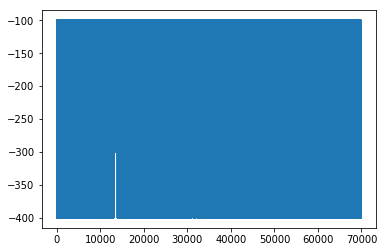

In [30]:
def q_learning(): 
    request_list = requests() 
    #print request_list 
    get_item_array = [] 
    reward_array = [] 
    for req in request_list: 
        r = req.split(' ') 
        reward = 0 
        print req 
        if (r[0].strip() == "STORE"): 
            rack = egreedy(int(r[1])-1) 
            print "rack", rack 
            Store(rack, int(r[1]), int(r[2])) 
            #print_warehouse()
        else: #Get request 
            rack, reward = Get(int(r[1]), int(r[2])) 
            reward_array.append(reward) 
            get_item_array.append(int(r[1])) # make get_item_array 
            if (rack != 0): 
                update_Q(int(r[1])-1, rack-1) 
    print probability_distribution(get_item_array) 
    plot(reward_array) 
q_learning() 
print_matrix(Q) 


In [31]:
print_warehouse() 


1->(0, 0)	
2->(5, 116)	
3->(0, 0)	

4->(0, 0)	
5->(0, 0)	
6->(0, 0)	

7->(0, 0)	
8->(0, 0)	
9->(5, 516)	

10->(3, 400)	
11->(0, 0)	
12->(0, 0)	

